In [ ]:
!pip install pmdarima
!pip install statsmodels
!pip install prophet
!pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 25.6 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import json
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.vector_ar.var_model import VAR
from sklearn.ensemble import RandomForestRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import xgboost as xgb
from keras.layers import Dropout
from keras.optimizers import Adam
from matplotlib.ticker import MaxNLocator
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from pmdarima import auto_arima
from math import sqrt
import statsmodels.api as sm
import pmdarima as pm
from sklearn.metrics import mean_absolute_percentage_error
from xgboost import XGBRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

In [ ]:
# Import the data frame
df = pd.read_csv('df_predict.csv')
df = df[['timestamp', 'amount', 'category']]
df['timestamp'] = pd.to_datetime(df['timestamp'])   # convert to datetime
df['timestamp'] = df['timestamp'].dt.tz_convert(None)
df = df.sort_values('timestamp')
df


,timestamp,amount,category
7251,2019-01-01,-9.87,bills and utilities
7227,2019-01-01,-42.07,bills and utilities
7228,2019-01-01,-0.01,fees and charges
7229,2019-01-01,-32.17,transfer
7230,2019-01-01,-39.99,groceries / food spend
...,...,...,...
4,2023-01-28,20.25,taxes
3,2023-01-28,-13.50,transfer
2,2023-01-28,50.40,transfer
1,2023-01-28,-30.51,shopping


In [ ]:
# First create a copy of your original dataframe to avoid modifying original data
df_diff = df.copy()

# Loop over each category
for category in df_diff['category'].unique():
    # Select data for the current category
    category_df = df_diff[df_diff['category'] == category]['amount']

    # Perform Augmented Dickey-Fuller test
    result = adfuller(category_df)

    # If the series is non-stationary (p-value > 0.05), difference it
    if result[1] > 0.05:
        df_diff.loc[df_diff['category'] == category, 'amount'] = category_df.diff()

# Drop the first row of each category because differencing creates NaN values
df_diff.dropna(subset=['amount'], inplace=True)

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:940: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


In [ ]:
df['amount_lag1'] = df.groupby('category')['amount'].shift(1)

In [ ]:
# Split the data by category and only select 'timestamp' and 'amount' columns
df_diff_category = df_diff[df_diff['category']==category][['timestamp', 'amount']]
df_diff_category = df_diff_category.set_index('timestamp')

# ARIMA Model

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2831.271, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2829.840, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2829.464, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2829.325, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3237.888, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2771.079, Time=0.42 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2746.572, Time=0.40 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2745.956, Time=1.82 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2762.702, Time=2.09 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2778.400, Time=0.68 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=2787.147, Time=0.86 sec

Best model:  ARIMA(1,0,3)(0,0,0)[0] intercept
Total fit time: 7.830 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/pyth

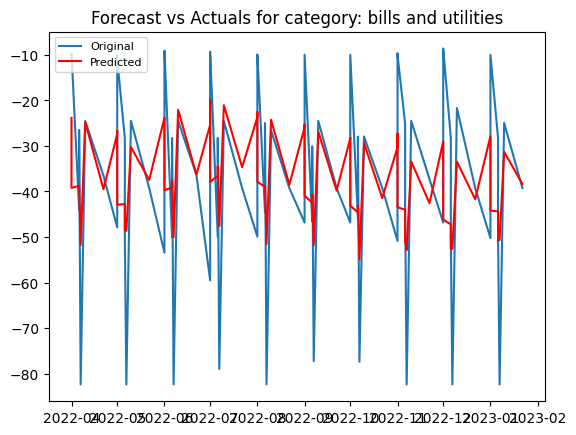

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1060.503, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1050.239, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1025.171, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1097.035, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1025.091, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1026.642, Time=0.09 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1017.840, Time=0.11 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=956.791, Time=0.20 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=950.106, Time=0.31 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1011.652, Time=0.13 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=872.560, Time=0.31 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=879.568, Time=0.25 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=813.7

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/u

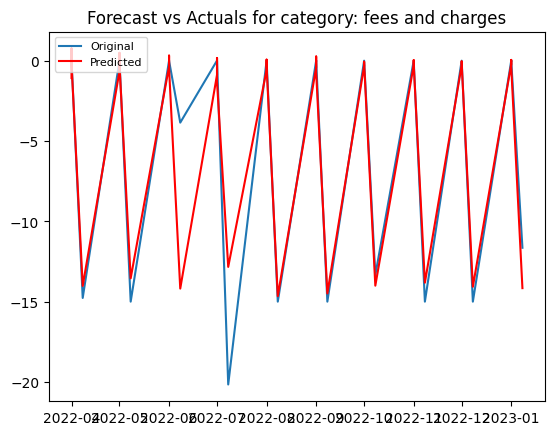

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=18055.032, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=18019.654, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=18009.879, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=18113.719, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=17986.211, Time=0.37 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=17947.285, Time=0.65 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=17944.958, Time=1.61 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=17951.927, Time=0.87 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=17946.970, Time=2.16 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=18095.202, Time=0.45 sec

Best model:  ARIMA(1,0,3)(0,0,0)[0] intercept
Total fit time: 7.849 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

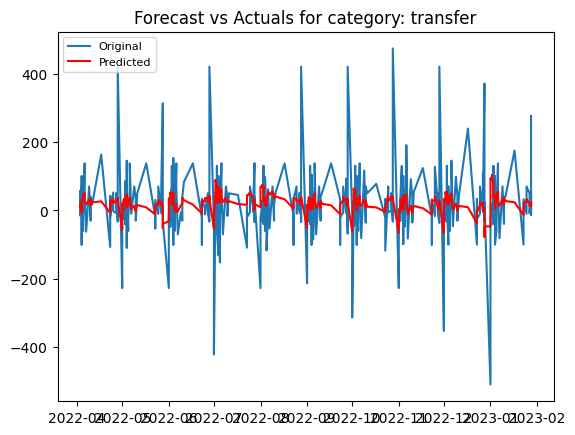

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=4565.929, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=4547.911, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=4551.478, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4828.028, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=4543.242, Time=0.14 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=4539.369, Time=0.19 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=4670.850, Time=0.06 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 2.176 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

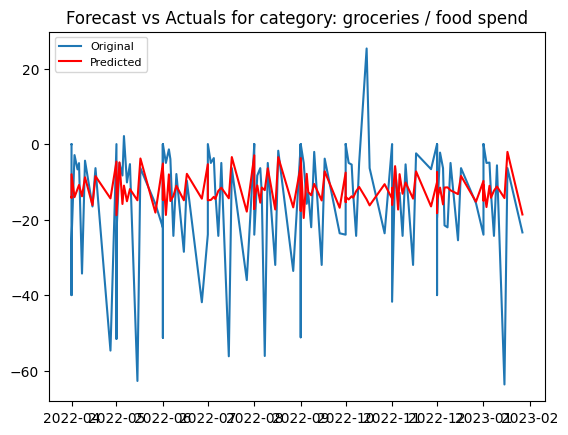

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=5671.583, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=5847.627, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=5786.748, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=5718.436, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5846.486, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=5660.739, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=5659.678, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=5660.507, Time=0.13 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=5661.665, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=5661.864, Time=0.09 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 1.357 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

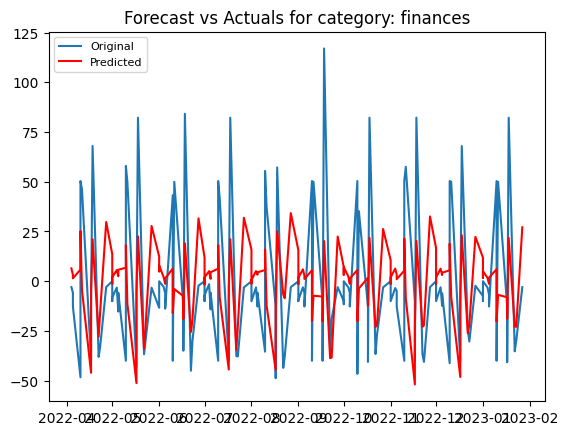

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=5266.283, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=5297.840, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=5264.749, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=5269.271, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5646.296, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=5265.888, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=5267.179, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=5590.687, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.898 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

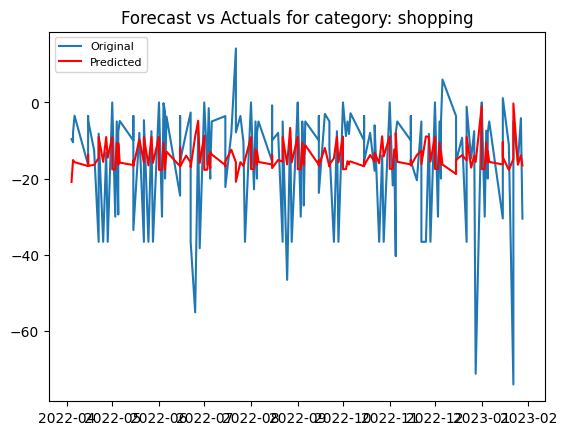

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=470.889, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=451.804, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=468.926, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=451.364, Time=0.06 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=451.067, Time=0.07 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=449.342, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=449.549, Time=0.04 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=446.494, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=444.661, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=443.251, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=443.130, Time=0.02 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_date

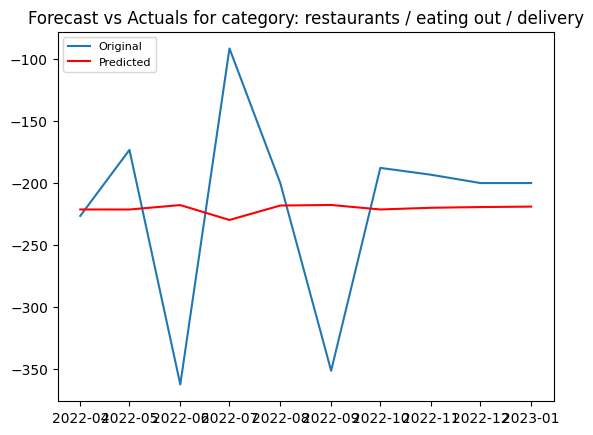

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2022.727, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2082.334, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2055.686, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2021.352, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2394.341, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2000.664, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1947.955, Time=0.13 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1949.870, Time=0.61 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=2151.528, Time=0.10 sec

Best model:  ARIMA(0,0,3)(0,0,0)[0] intercept
Total fit time: 1.572 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

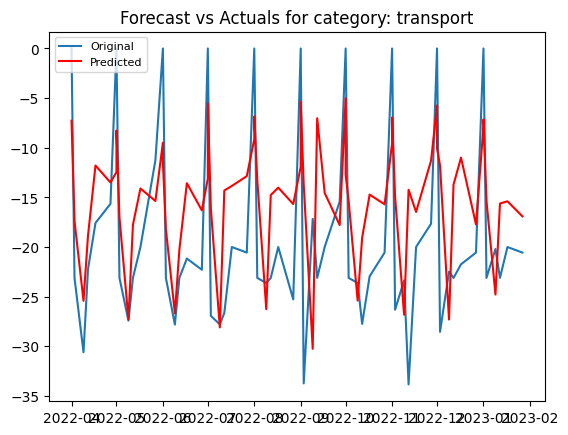

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1575.208, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1642.244, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1616.862, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1577.873, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1687.431, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1488.547, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1466.952, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1416.575, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1416.710, Time=0.20 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=1440.246, Time=0.03 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.758 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

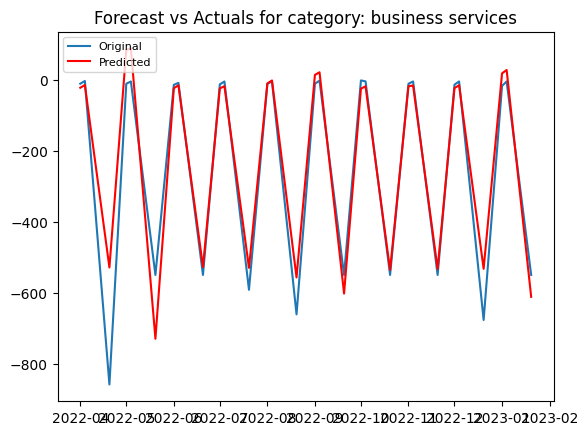

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=3260.212, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=3282.704, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=3265.002, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=3263.707, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3281.343, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=3261.003, Time=0.31 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=3261.505, Time=0.32 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=3264.679, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=3266.912, Time=0.12 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=3259.729, Time=0.35 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=3219.232, Time=0.70 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=3256.007, Time=0.29 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=3258.166, Time=0.55 sec
 ARIMA(3,0,2)(0,0,0)[0]             : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/pyth

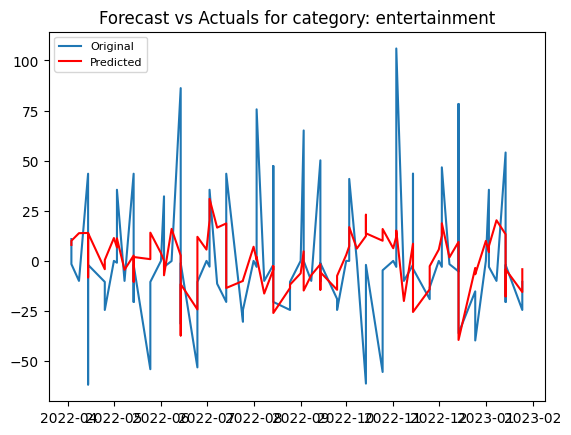

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=471.062, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=513.111, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=494.332, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=495.799, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=541.921, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=473.051, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=497.497, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=495.966, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=inf, Time=0.14 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.955 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

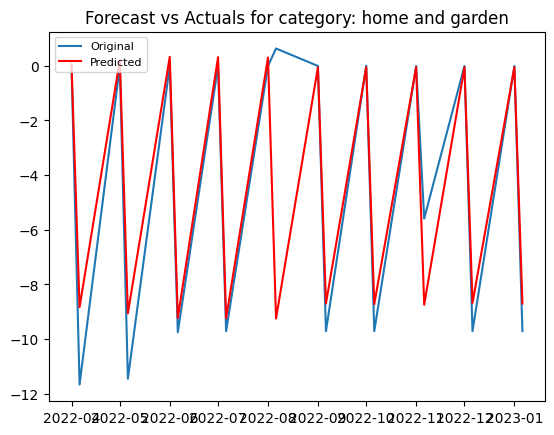

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=724.562, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1059.077, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=812.870, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=723.285, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1667.413, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=724.793, Time=0.44 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1626.208, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 1.711 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

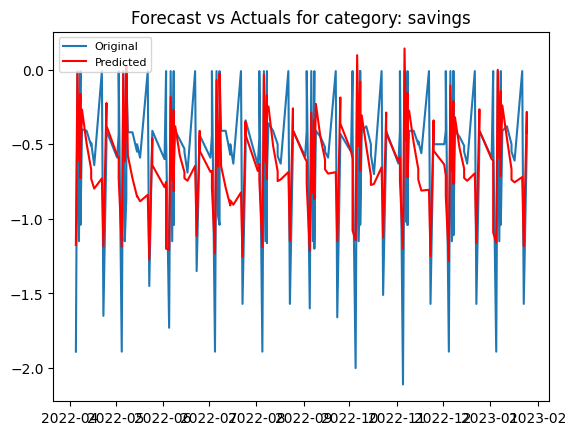

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1854: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(self.cov_params()))


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1043.359, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1011.298, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1469.996, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=524.685, Time=0.16 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1018.362, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=293.739, Time=0.38 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=338.226, Time=0.41 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=451.636, Time=0.26 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=34.540, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1047.104, Time=0.15 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=-1.657, Time=0.24

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/u

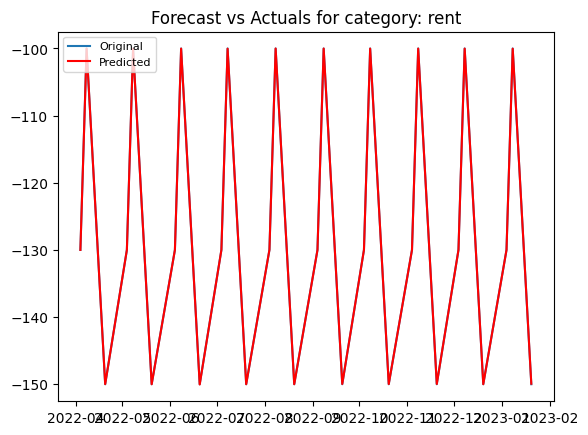

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=4001.338, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=3979.245, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4118.185, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=3933.828, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=3906.343, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=3841.119, Time=0.31 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=3923.173, Time=0.28 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.40 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 3.225 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

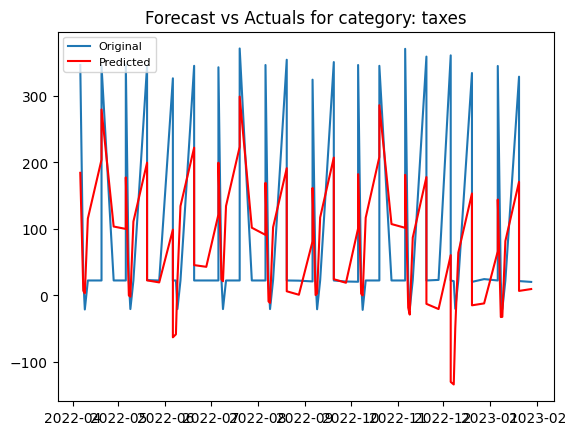

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=296.017, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=292.819, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=294.017, Time=0.01 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=286.554, Time=0.05 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=285.880, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=283.987, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=284.577, Time=0.03 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=282.980, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=281.368, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=280.180, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=278.734, Time=0.04 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

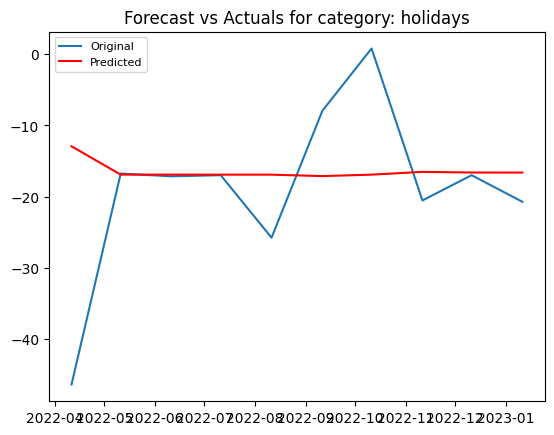

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-package

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=680.487, Time=0.01 sec
Total fit time: 0.012 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

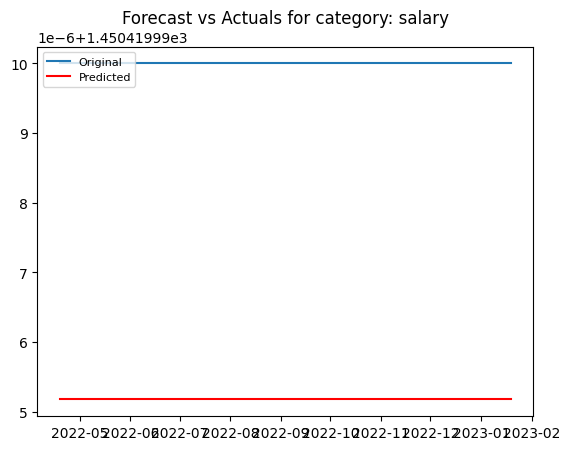

,category,RMSE,MAE,MSE
0,bills and utilities,19.427341,15.723987,3.774216e+02
1,fees and charges,2.116536,0.935996,4.479727e+00
2,transfer,93.264780,61.238489,8.698319e+03
3,groceries / food spend,15.186948,11.711653,2.306434e+02
4,finances,29.313381,22.927344,8.592743e+02
5,shopping,14.214213,10.918982,2.020439e+02
6,restaurants / eating out / delivery,79.354103,58.568154,6.297074e+03
7,transport,8.473828,7.404175,7.180576e+01
8,business services,83.246126,47.949393,6.929918e+03
9,entertainment,30.140525,21.380735,9.084513e+02


In [ ]:
# Metrics DataFrame
df_metrics_arima = pd.DataFrame(columns=['category', 'RMSE', 'MAE', 'MSE'])

# Predictions DataFrame
df_preds_arima = pd.DataFrame()

categories = df['category'].unique()
for i, cat in enumerate(categories):
    # Filter data by category
    df_cat = df[df['category'] == cat].sort_values('timestamp')
    df_cat.set_index('timestamp', inplace=True)
    df_cat = df_cat['amount']

    if len(df_cat) > 30:   # Setting a minimum threshold of data points
        # Perform expanding window approach
        train_size = int(len(df_cat) * 0.8)
        train, test = df_cat[0:train_size], df_cat[train_size:]

        # Find the optimal ARIMA parameters
        model_auto = pm.auto_arima(train, start_p=1, start_q=1, test='adf',
                                   max_p=3, max_q=3,
                                   d=None, trace=True,
                                   error_action='ignore', suppress_warnings=True,
                                   stepwise=True)

        order = model_auto.order

        predictions = []
        for j in range(len(test)):
            model_arima = ARIMA(train, order=order)
            model_fit = model_arima.fit()
            output = model_fit.forecast()
            yhat = output.values[0]
            predictions.append(yhat)
            obs = test.iloc[j]
            train = pd.concat([train, pd.Series([obs], index=[test.index[j]])])

        # Calculate the evaluation metrics
        rmse = sqrt(mean_squared_error(test, predictions))
        mae = mean_absolute_error(test, predictions)
        mse = mean_squared_error(test, predictions)
        df_metrics_arima = df_metrics_arima.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)

        df_pred = pd.DataFrame({'timestamp': test.index, 'amount': predictions, 'category': cat})
        df_preds_arima = pd.concat([df_preds_arima, df_pred], ignore_index=True)

        # Plot the original series and the predicted values
        plt.figure(i)
        plt.plot(df_cat.index[-len(test):], test, label='Original')
        plt.plot(test.index, predictions, label='Predicted', color='red')
        plt.title('Forecast vs Actuals for category: {}'.format(cat))
        plt.legend(loc='upper left', fontsize=8)
        plt.show()

df_metrics_arima


In [ ]:
df_metrics_arima

,category,RMSE,MAE,MSE
0,bills and utilities,19.427341,15.723987,3.774216e+02
1,fees and charges,2.116536,0.935996,4.479727e+00
2,transfer,93.264780,61.238489,8.698319e+03
3,groceries / food spend,15.186948,11.711653,2.306434e+02
4,finances,29.313381,22.927344,8.592743e+02
5,shopping,14.214213,10.918982,2.020439e+02
6,restaurants / eating out / delivery,79.354103,58.568154,6.297074e+03
7,transport,8.473828,7.404175,7.180576e+01
8,business services,83.246126,47.949393,6.929918e+03
9,entertainment,30.140525,21.380735,9.084513e+02


# SARIMA Model

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=2978.608, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=2877.968, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=2976.628, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=2911.155, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=2877.080, Time=0.53 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(2,1,0)[7] intercept   : AIC=2878.873, Time=0.59 sec
 ARIMA(2,0,0)(2,1,0)[7] intercept   : AIC=2878.520, Time=1.03 sec
 ARIMA(1,0,1)(2,1,0)[7] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,1)(2,1,0)[7] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(2,0,1)(2,1,0)[7] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,0,0)(2,1,0)[7]             : AIC=2875.108, Time=0.41 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

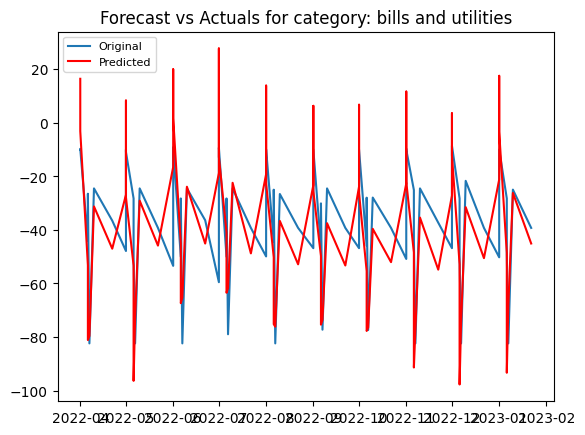

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=1156.441, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=1113.176, Time=0.18 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=1154.442, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=1124.195, Time=0.08 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=1012.653, Time=0.54 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(2,1,0)[7] intercept   : AIC=1102.083, Time=0.23 sec
 ARIMA(2,0,0)(2,1,0)[7] intercept   : AIC=969.405, Time=0.69 sec
 ARIMA(2,0,0)(1,1,0)[7] intercept   : AIC=967.655, Time=0.41 sec
 ARIMA(2,0,0)(0,1,0)[7] intercept   : AIC=1115.985, Time=0.09 sec
 ARIMA(2,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,0)(0,1,1)[7] intercept   : AIC=inf, Time=0.55 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist

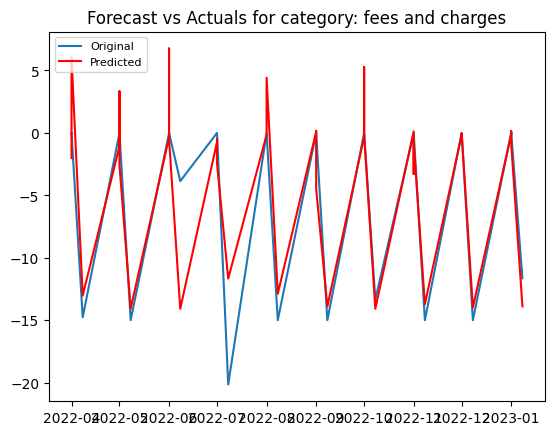

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=3.62 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=18997.672, Time=0.08 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=18548.457, Time=1.23 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=18995.672, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=18981.899, Time=0.09 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=18347.700, Time=2.17 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=3.28 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(0,0,0)(2,1,0)[7] intercept   : AIC=18380.277, Time=2.41 sec
 ARIMA(2,0,0)(2,1,0)[7] intercept   : AIC=18343.539, Time=3.49 sec
 ARIMA(2,0,0)(1,1,0)[7] intercept   : AIC=18540.565, Time=1.77 sec
 ARIMA(2,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=4.52 sec
 ARIMA(2,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=2.20 sec
 ARIMA(3,0,0)(2,1,0)[7] intercept   : AIC=18319.178, Ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

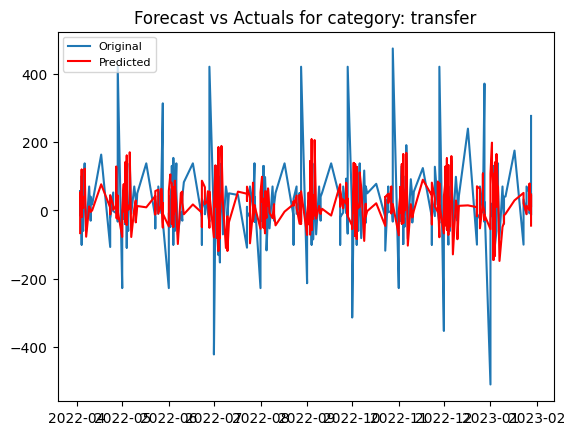

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=4973.413, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=4593.562, Time=0.46 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=4971.414, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=4955.457, Time=0.13 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=4580.855, Time=0.82 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=2.43 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,0,0)(2,1,0)[7] intercept   : AIC=4585.621, Time=0.96 sec
 ARIMA(2,0,0)(2,1,0)[7] intercept   : AIC=4582.723, Time=1.18 sec
 ARIMA(1,0,1)(2,1,0)[7] intercept   : AIC=inf, Time=3.23 sec
 ARIMA(0,0,1)(2,1,0)[7] intercept   : AIC=4580.623, Time=0.84 sec
 ARIMA(0,0,1)(1,1,0)[7] intercept   : AIC=4593.075, Time=0.43 sec
 ARIMA(0,0,1)(2,1,1)[7] intercept   : AIC=inf, Time=2.67 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

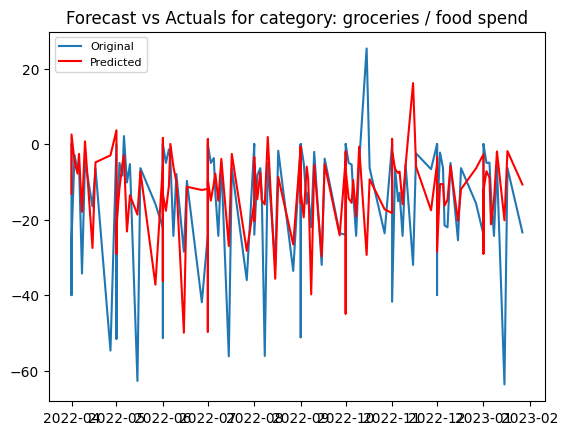

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=6176.550, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=5980.812, Time=0.39 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=6174.554, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=6129.503, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=5942.201, Time=0.83 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,0)(2,1,0)[7] intercept   : AIC=5995.194, Time=0.94 sec
 ARIMA(2,0,0)(2,1,0)[7] intercept   : AIC=5771.858, Time=1.27 sec
 ARIMA(2,0,0)(1,1,0)[7] intercept   : AIC=5777.072, Time=0.63 sec
 ARIMA(2,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(2,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(3,0,0)(2,1,0)[7] intercept   : AIC=5755.683, Time=1.63 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

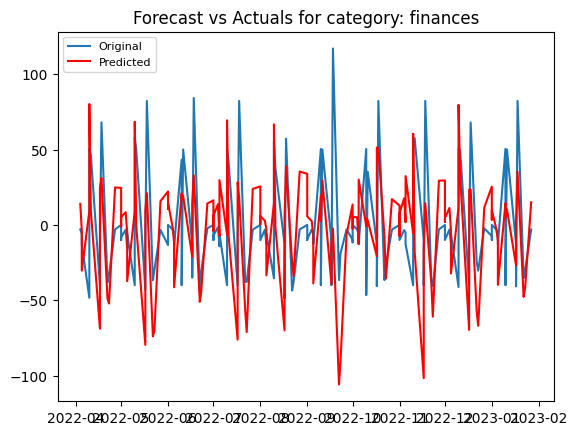

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=5672.823, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=5426.337, Time=0.52 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=5670.824, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=5648.571, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=5383.076, Time=1.00 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=2.61 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(2,1,0)[7] intercept   : AIC=5401.633, Time=1.29 sec
 ARIMA(2,0,0)(2,1,0)[7] intercept   : AIC=5384.439, Time=1.41 sec
 ARIMA(1,0,1)(2,1,0)[7] intercept   : AIC=5384.763, Time=1.37 sec
 ARIMA(0,0,1)(2,1,0)[7] intercept   : AIC=5383.023, Time=0.95 sec
 ARIMA(0,0,1)(1,1,0)[7] intercept   : AIC=5425.076, Time=0.37 sec
 ARIMA(0,0,1)(2,1,1)[7] intercept   : AIC=inf, Time=2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

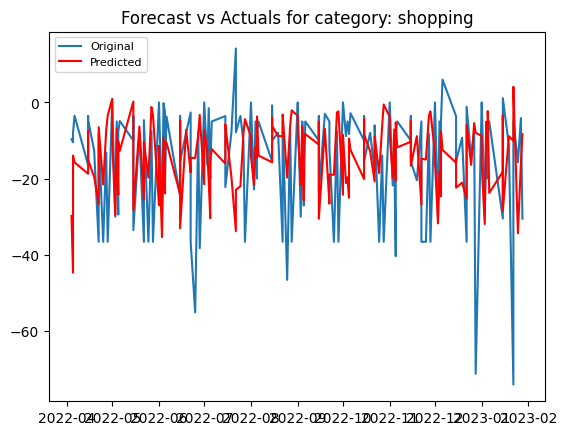

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[7]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,1,0)[7]             : AIC=398.091, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[7]             : AIC=379.803, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[7]             : AIC=inf, Time=0.17 sec
 ARIMA(1,1,0)(0,1,0)[7]             : AIC=386.104, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[7]             : AIC=373.855, Time=0.21 sec
 ARIMA(1,1,0)(2,1,1)[7]             : AIC=375.089, Time=0.47 sec
 ARIMA(1,1,0)(1,1,1)[7]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(2,1,0)[7]             : AIC=381.941, Time=0.10 sec
 ARIMA(2,1,0)(2,1,0)[7]             : AIC=374.159, Time=0.24 sec
 ARIMA(1,1,1)(2,1,0)[7]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,1)(2,1,0)[7]             : AIC=inf, Time=0.36 sec
 ARIMA(2,1,1)(2,1,0)[7]             : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(2,1,0)[7] intercept   : AIC=375.808, Time=0.24 sec

Best model:  ARIMA(1,1,0)(2,1,0)[7]          
Total fit time: 3.182 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 

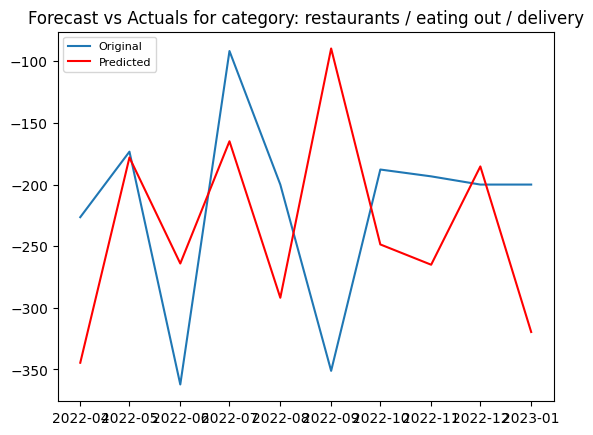

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=1673.605, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=1599.596, Time=0.23 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=1671.619, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=1674.347, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=1570.491, Time=0.37 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(2,1,0)[7] intercept   : AIC=1569.951, Time=0.47 sec
 ARIMA(0,0,0)(1,1,0)[7] intercept   : AIC=1600.881, Time=0.17 sec
 ARIMA(0,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,1)(2,1,0)[7] intercept   : AIC=1570.612, Time=0.36 sec
 ARIMA(1,0,1)(2,1,0)[7] intercept   : AIC=1571.386, Time=0.95 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

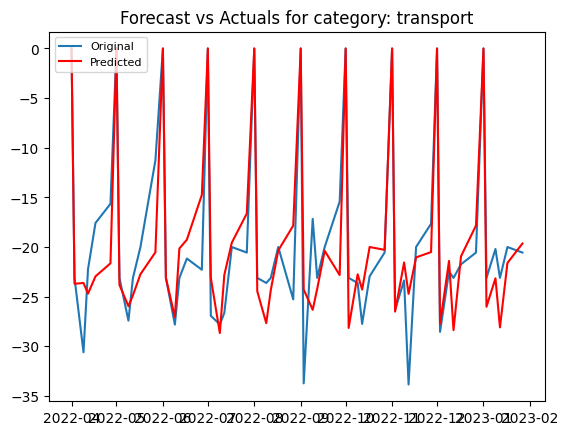

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=1663.207, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=1610.608, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=1661.211, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=1638.202, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,0)(0,1,1)[7] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,0)(1,1,0)[7] intercept   : AIC=1635.021, Time=0.29 sec
 ARIMA(2,0,0)(1,1,0)[7] intercept   : AIC=1449.483, Time=0.37 sec
 ARIMA(2,0,0)(0,1,0)[7] intercept   : AIC=1465.111, Time=0.08 sec
 ARIMA(2,0,0)(2,1,0)[7] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(2,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/stat

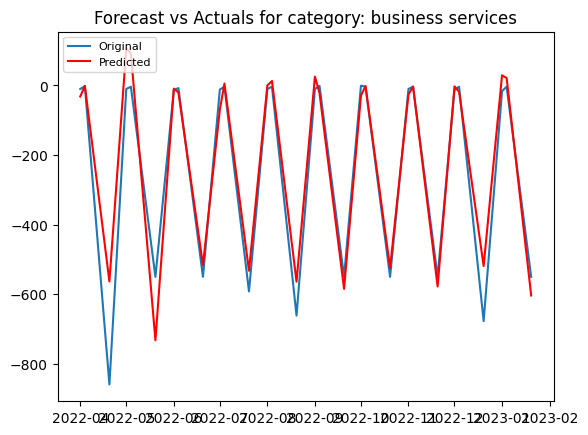

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=3413.582, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=3345.289, Time=0.41 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=3411.597, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=3402.796, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=3318.922, Time=0.50 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(2,1,0)[7] intercept   : AIC=3330.918, Time=0.70 sec
 ARIMA(2,0,0)(2,1,0)[7] intercept   : AIC=3320.921, Time=0.97 sec
 ARIMA(1,0,1)(2,1,0)[7] intercept   : AIC=3307.447, Time=1.06 sec
 ARIMA(1,0,1)(1,1,0)[7] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,0,1)(2,1,1)[7] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(1,0,1)(1,1,1)[7] intercept   : AIC=inf, Time=1.04 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

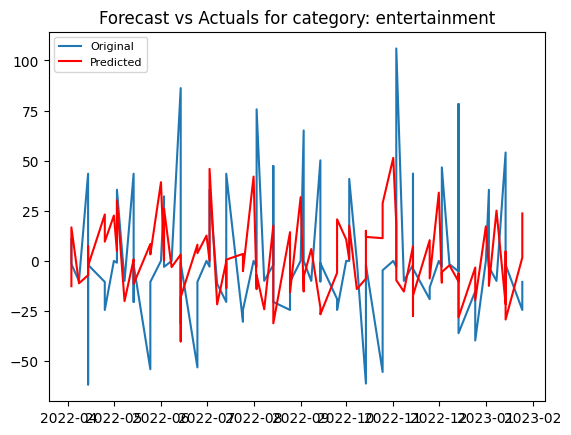

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=445.986, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=541.117, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=459.720, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=469.617, Time=0.20 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=539.165, Time=0.02 sec
 ARIMA(1,0,1)(0,1,0)[7] intercept   : AIC=478.493, Time=0.17 sec
 ARIMA(1,0,1)(1,1,1)[7] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(1,0,1)(0,1,2)[7] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,0,1)(1,1,0)[7] intercept   : AIC=450.745, Time=0.31 sec
 ARIMA(1,0,1)(1,1,2)[7] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,0,0)(0,1,1)[7] intercept   : AIC=468.322, Time=0.08 sec
 ARIMA(2,0,1)(0,1,1)[7] intercept   : AIC=470.728, Time=0.27 sec
 ARIMA(1,0,2)(0,1,1)[7] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,1,1)[7] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,2)(0,1,1)[7] intercept   : AIC=471.371, Time=0.23 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

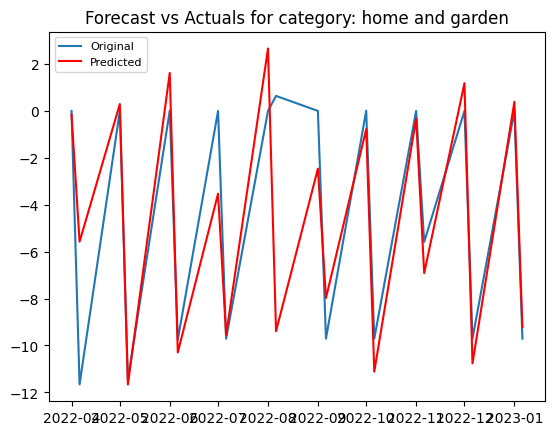

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=1698.003, Time=0.13 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=1221.472, Time=0.41 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=1696.003, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=1356.934, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=1061.018, Time=1.01 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=3.30 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,0,0)(2,1,0)[7] intercept   : AIC=1309.593, Time=0.84 sec
 ARIMA(2,0,0)(2,1,0)[7] intercept   : AIC=1062.948, Time=1.78 sec
 ARIMA(1,0,1)(2,1,0)[7] intercept   : AIC=978.349, Time=2.34 sec
 ARIMA(1,0,1)(1,1,0)[7] intercept   : AIC=1074.821, Time=1.12 sec
 ARIMA(1,0,1)(2,1,1)[7] intercept   : AIC=inf, Time=3.94 sec
 ARIMA(1,0,1)(1,1,1)[7] intercept   : AIC=inf, Time=2.24 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/stat

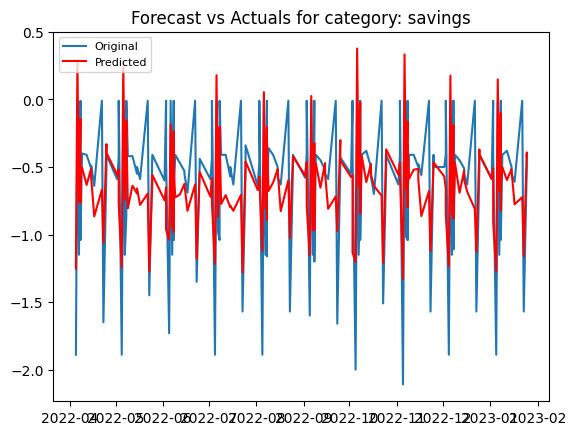

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1854: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(self.cov_params()))


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=1102.702, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=1044.341, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=1100.704, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=1072.653, Time=0.08 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,1,1)[7] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=2.47 sec
 ARIMA(0,0,0)(1,1,0)[7] intercept   : AIC=1074.373, Time=0.11 sec
 ARIMA(2,0,0)(1,1,0)[7] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,0,1)(1,1,0)[7] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,1)(1,1,0)[7] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,0,1)(1,1,0)[7] intercept   : AIC=-127.307, Time=0.78 sec
 ARIMA(2,0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/

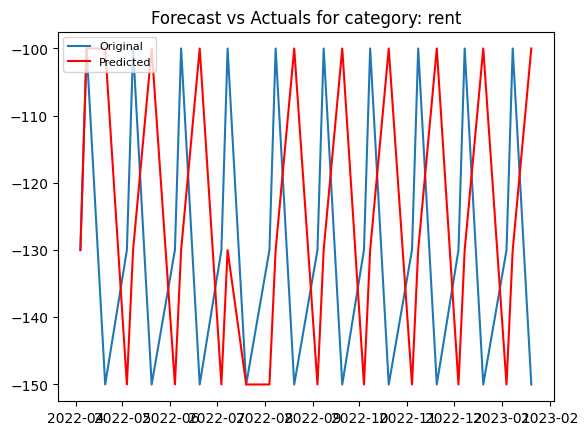

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,1,0)[7] intercept   : AIC=4112.360, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[7] intercept   : AIC=4054.657, Time=0.32 sec
 ARIMA(0,0,1)(0,1,1)[7] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[7]             : AIC=4110.370, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[7] intercept   : AIC=4076.137, Time=0.12 sec
 ARIMA(1,0,0)(2,1,0)[7] intercept   : AIC=3969.583, Time=0.55 sec
 ARIMA(1,0,0)(2,1,1)[7] intercept   : AIC=3886.084, Time=1.58 sec
 ARIMA(1,0,0)(1,1,1)[7] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(2,1,2)[7] intercept   : AIC=3888.011, Time=2.39 sec
 ARIMA(1,0,0)(1,1,2)[7] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,0,0)(2,1,1)[7] intercept   : AIC=3912.627, Time=1.43 sec
 ARIMA(2,0,0)(2,1,1)[7] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,0,1)(2,1,1)[7] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,0,1)(2,1,1)[7] intercept   : AIC=inf, Time=1.31 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

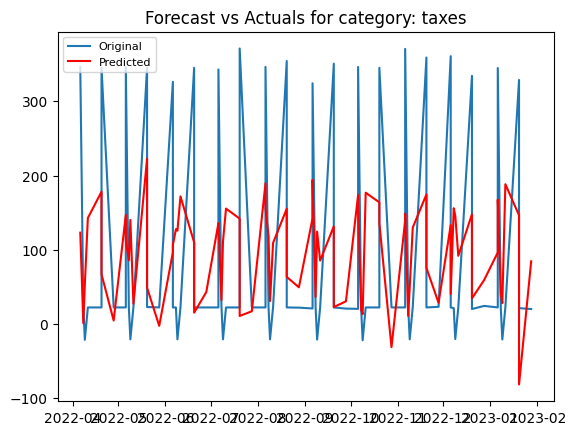

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[7]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,1,0)[7]             : AIC=270.514, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[7]             : AIC=254.266, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[7]             : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,1,0)[7]             : AIC=268.610, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[7]             : AIC=250.492, Time=0.17 sec
 ARIMA(1,1,0)(2,1,1)[7]             : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(1,1,1)[7]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(2,1,0)[7]             : AIC=257.101, Time=0.08 sec
 ARIMA(2,1,0)(2,1,0)[7]             : AIC=248.105, Time=0.20 sec
 ARIMA(2,1,0)(1,1,0)[7]             : AIC=252.073, Time=0.09 sec
 ARIMA(2,1,0)(2,1,1)[7]             : AIC=inf, Time=0.59 sec
 ARIMA(2,1,0)(1,1,1)[7]             : AIC=inf, Time=0.41 sec
 ARIMA(3,1,0)(2,1,0)[7]             : AIC=248.921, Time=0.26 sec
 ARIMA(2,1,1)(2,1,0)[7]             : AIC=246.133, Time=0.34 sec
 ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/p

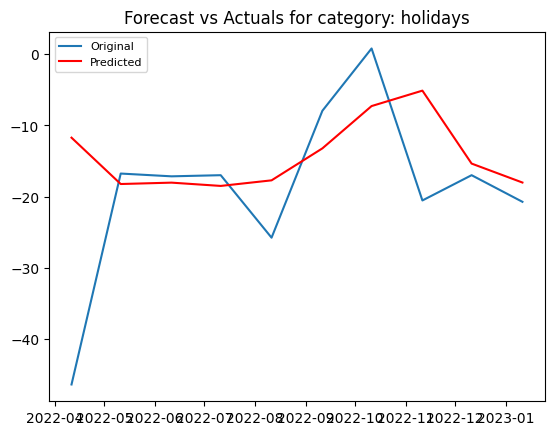

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/ts

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=680.487, Time=0.02 sec
Total fit time: 0.018 seconds


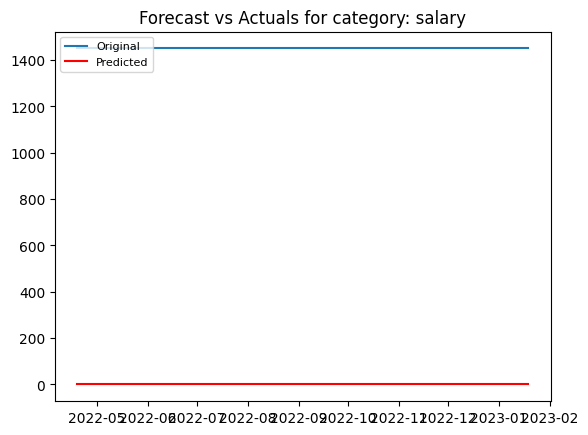

,category,RMSE,MAE,MSE
0,bills and utilities,22.986664,18.356551,5.283867e+02
1,fees and charges,3.120464,1.971173,9.737297e+00
2,transfer,107.436640,75.625783,1.154263e+04
3,groceries / food spend,17.611378,12.241722,3.101606e+02
4,finances,34.054589,27.595727,1.159715e+03
5,shopping,16.228109,11.577451,2.633515e+02
6,restaurants / eating out / delivery,113.654334,91.439367,1.291731e+04
7,transport,3.538527,2.273504,1.252117e+01
8,business services,81.347280,50.398940,6.617380e+03
9,entertainment,37.581729,28.783404,1.412386e+03


In [ ]:
# Metrics DataFrame
df_metrics_sarima = pd.DataFrame(columns=['category', 'RMSE', 'MAE', 'MSE'])  # Added 'MSE'

# Predictions DataFrame
df_preds_sarima = pd.DataFrame()

categories = df['category'].unique()
for i, cat in enumerate(categories):
    # Filter data by category
    df_cat = df[df['category'] == cat].sort_values('timestamp')
    df_cat.set_index('timestamp', inplace=True)
    df_cat = df_cat['amount']

    if len(df_cat) > 30:   # Setting a minimum threshold of data points
        # Perform expanding window approach
        train_size = int(len(df_cat) * 0.8)
        train, test = df_cat[0:train_size], df_cat[train_size:]

        # Find the optimal SARIMA parameters
        model_auto = pm.auto_arima(train, start_p=1, start_q=1, test='adf',
                                   max_p=3, max_q=3, m=7, start_P=0, seasonal=True,
                                   d=None, D=1, trace=True,
                                   error_action='ignore', suppress_warnings=True,
                                   stepwise=True)

        order = model_auto.order
        seasonal_order = model_auto.seasonal_order

        predictions = []
        for j in range(len(test)):
            model_sarima = sm.tsa.SARIMAX(train, order=order, seasonal_order=seasonal_order)
            model_fit = model_sarima.fit(disp=0)
            output = model_fit.forecast()
            yhat = output.values[0]
            predictions.append(yhat)
            obs = test[j]
            train = pd.concat([train, pd.Series([obs], index=[test.index[j]])])

        # Calculate the evaluation metrics
        rmse = sqrt(mean_squared_error(test, predictions))
        mae = mean_absolute_error(test, predictions)
        mse = mean_squared_error(test, predictions)  # New line to compute the MSE
        df_metrics_sarima = df_metrics_sarima.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)  # Added 'MSE': mse

        df_pred = pd.DataFrame({'timestamp': test.index, 'amount': predictions, 'category': cat})
        df_preds_sarima = pd.concat([df_preds_sarima, df_pred], ignore_index=True)

        # Plot the original series and the predicted values
        plt.figure(i)
        plt.plot(df_cat.index[-len(test):], test, label='Original')
        plt.plot(test.index, predictions, label='Predicted', color='red')
        plt.title('Forecast vs Actuals for category: {}'.format(cat))
        plt.legend(loc='upper left', fontsize=8)
        plt.show()

df_metrics_sarima


# LSTM Model

In [ ]:
def timeseries_to_supervised(data, lag=1):
    df = pd.DataFrame(data)
    columns = [df.shift(i) for i in range(1, lag+1)]
    columns.append(df)
    df = pd.concat(columns, axis=1)
    df.fillna(0, inplace=True)
    return df

def scale(train, test):
    # Fit scaler
    scaler = MinMaxScaler(feature_range=(-1, 1))
    scaler = scaler.fit(train)
    # Transform train
    train = train.reshape(train.shape[0], train.shape[1])
    train_scaled = scaler.transform(train)
    # Transform test
    test = test.reshape(test.shape[0], test.shape[1])
    test_scaled = scaler.transform(test)
    return scaler, train_scaled, test_scaled

def create_model(neurons=1, learn_rate=0.01, dropout_rate=0.2):
    model = Sequential()
    model.add(LSTM(neurons, return_sequences=True, batch_input_shape=(1, num_lags, 1), stateful=True))
    model.add(Dropout(rate=dropout_rate)) # Adding dropout with the specified dropout rate
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer=Adam(lr=learn_rate))
    return model

def forecast_lstm(model, batch_size, X):
    X = X.reshape(1, X.shape[0], 1) # Reshape to (1, num_lags, 1)
    yhat = model.predict(X, batch_size=batch_size)
    return yhat[0,0]



def invert_scale(scaler, X, yhat):
    new_row = [x for x in X] + [yhat]
    array = np.array(new_row)
    array = array.reshape(1, len(array))
    inverted = scaler.inverse_transform(array)
    return inverted[0, -1]

def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

def preprocess_data(df_cat, use_differencing, num_lags):
    raw_values = df_cat.values
    if use_differencing:
        diff_values = raw_values[1:] - raw_values[:-1]
    else:
        diff_values = raw_values

    supervised = timeseries_to_supervised(diff_values, num_lags)
    supervised_values = supervised.values[num_lags:, :]

    return supervised_values, raw_values

<ipython-input-9-01061f932c27>:2: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  clf = KerasRegressor(build_fn=create_model, verbose=0, epochs=10, batch_size=1)
/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 17ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


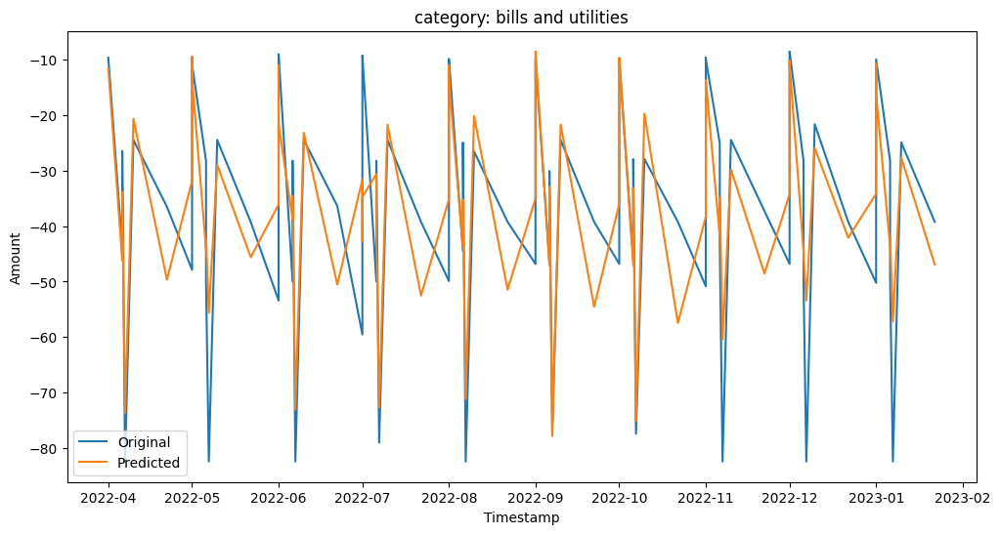

Best parameters for category bills and utilities: {'dropout_rate': 0.2, 'learn_rate': 0.01, 'neurons': 10}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 24ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


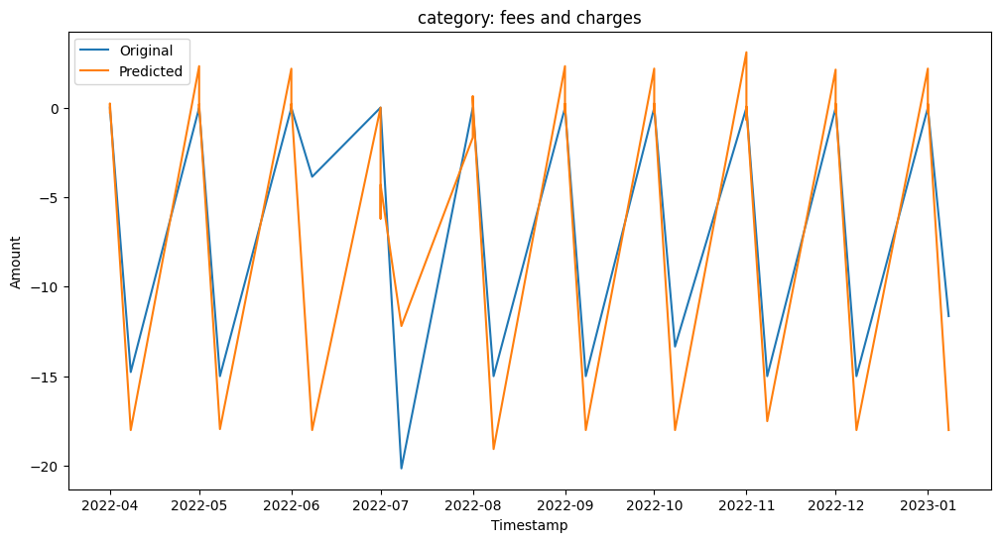

Best parameters for category fees and charges: {'dropout_rate': 0.2, 'learn_rate': 0.01, 'neurons': 10}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 19ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


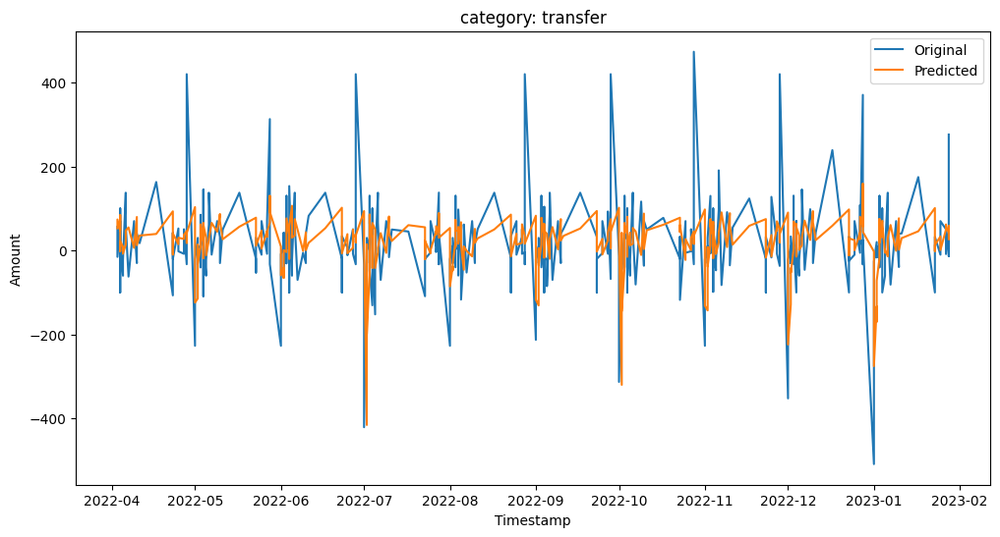

Best parameters for category transfer: {'dropout_rate': 0.2, 'learn_rate': 0.001, 'neurons': 50}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 18ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


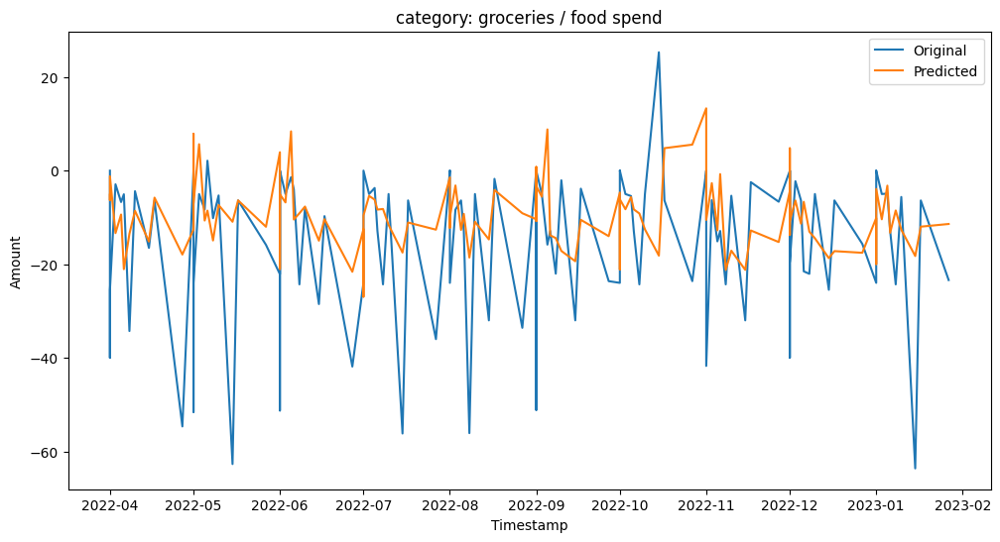

Best parameters for category groceries / food spend: {'dropout_rate': 0.3, 'learn_rate': 0.001, 'neurons': 100}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 21ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


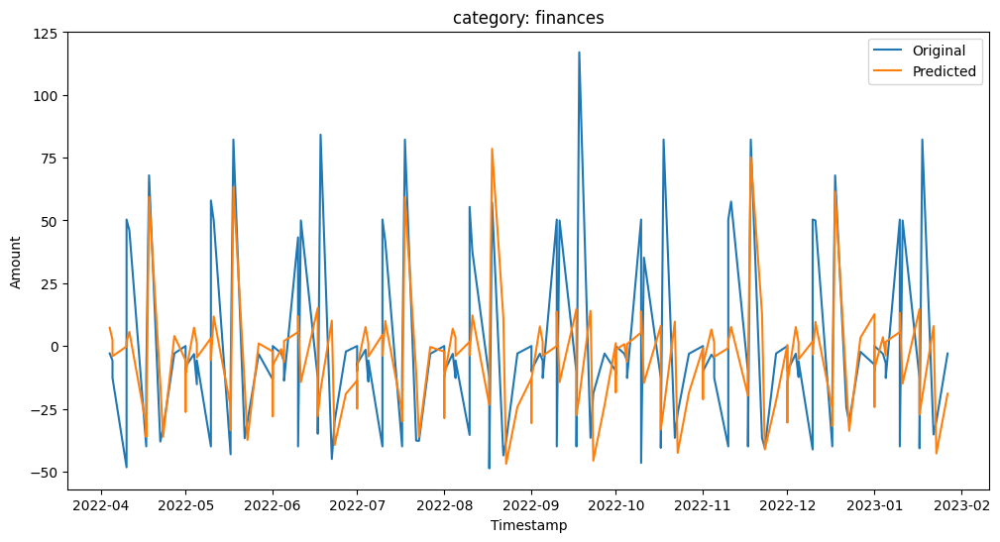

Best parameters for category finances: {'dropout_rate': 0.3, 'learn_rate': 0.001, 'neurons': 100}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 21ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


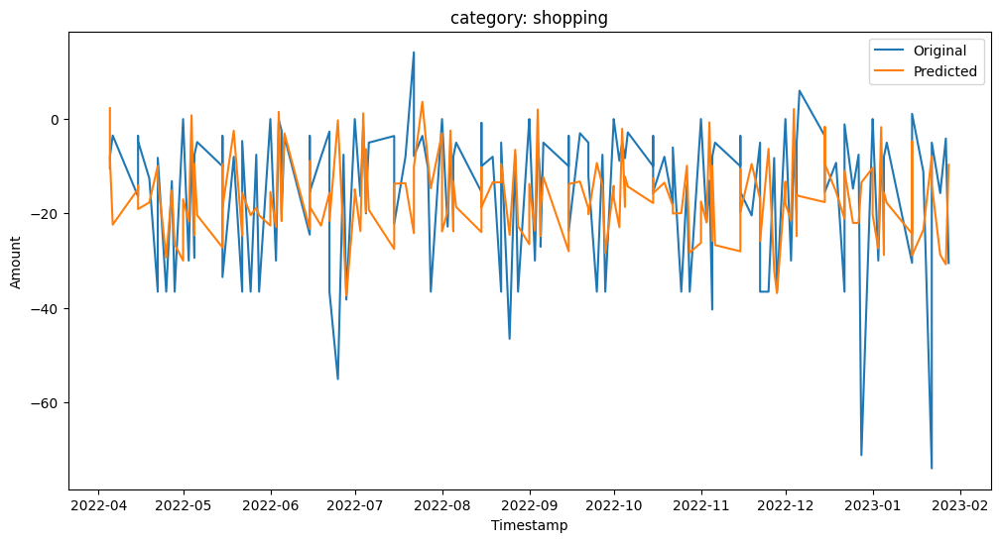

Best parameters for category shopping: {'dropout_rate': 0.3, 'learn_rate': 0.001, 'neurons': 100}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 20ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


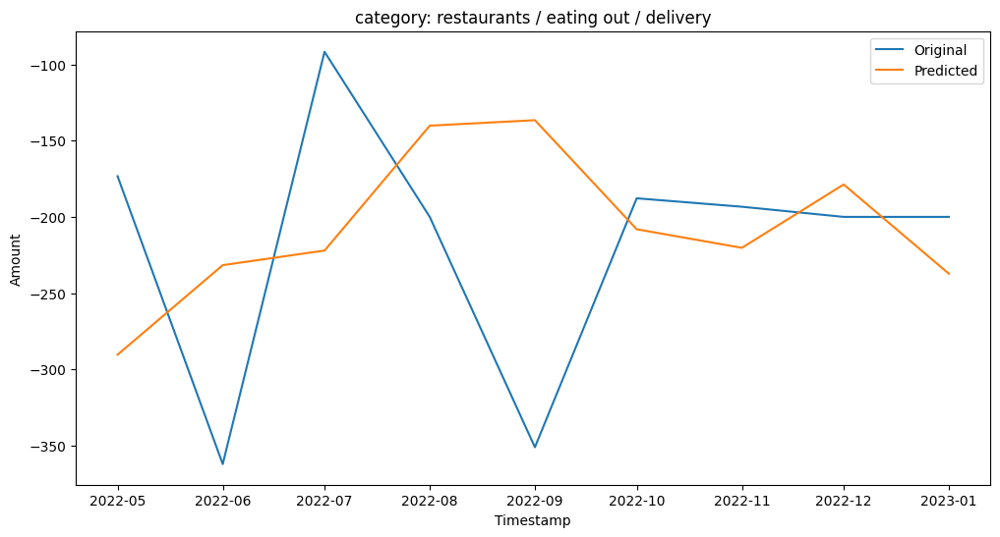

Best parameters for category restaurants / eating out / delivery: {'dropout_rate': 0.2, 'learn_rate': 0.01, 'neurons': 10}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 22ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


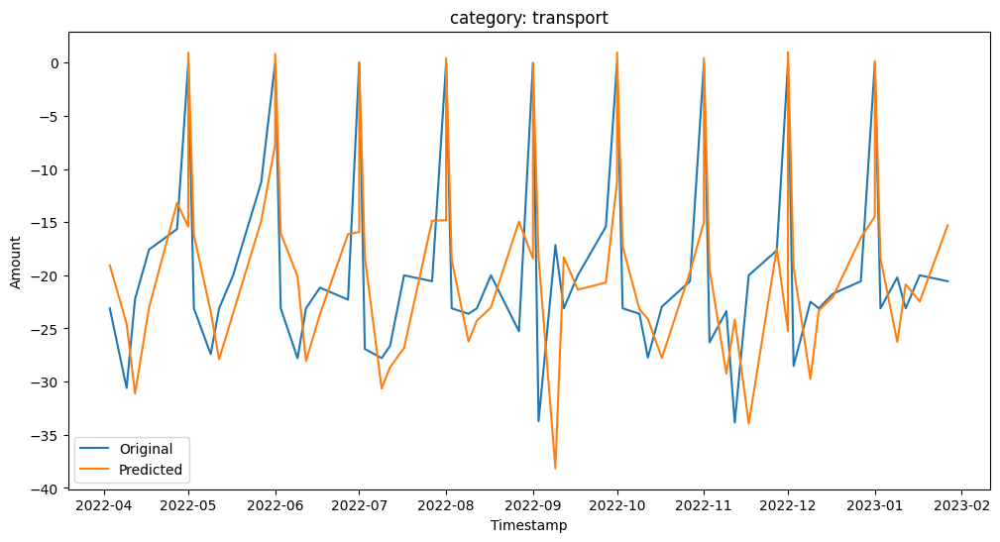

Best parameters for category transport: {'dropout_rate': 0.3, 'learn_rate': 0.01, 'neurons': 10}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 28ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


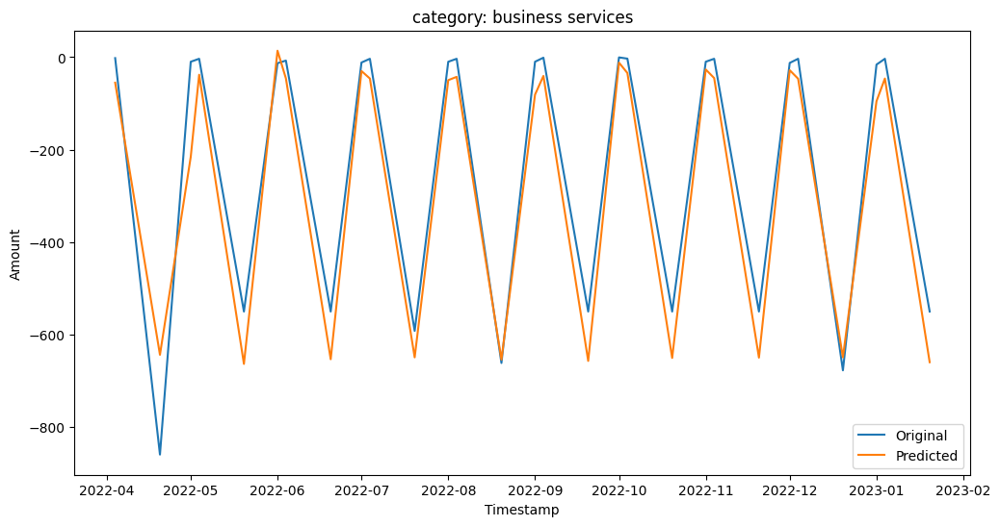

Best parameters for category business services: {'dropout_rate': 0.3, 'learn_rate': 0.01, 'neurons': 10}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 19ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


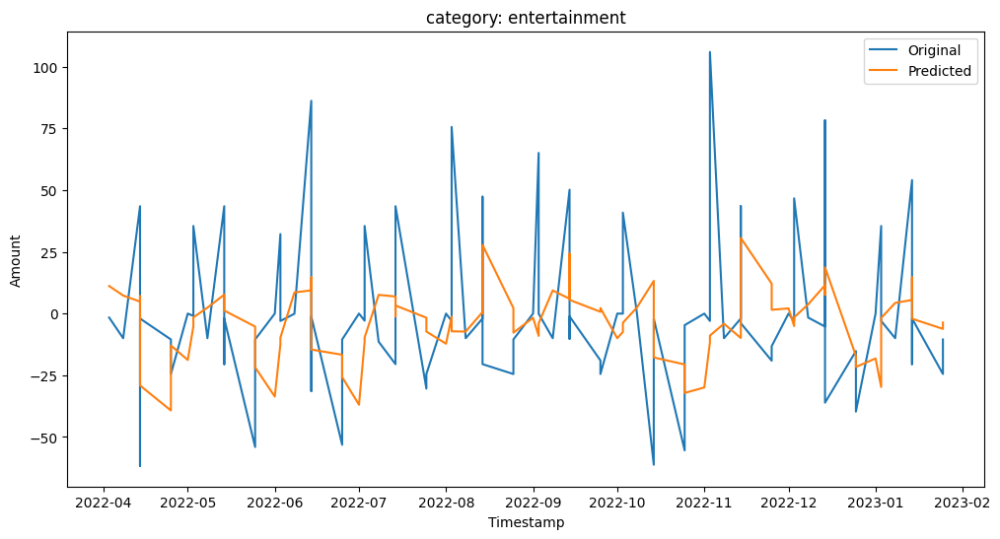

Best parameters for category entertainment: {'dropout_rate': 0.3, 'learn_rate': 0.001, 'neurons': 50}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 18ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


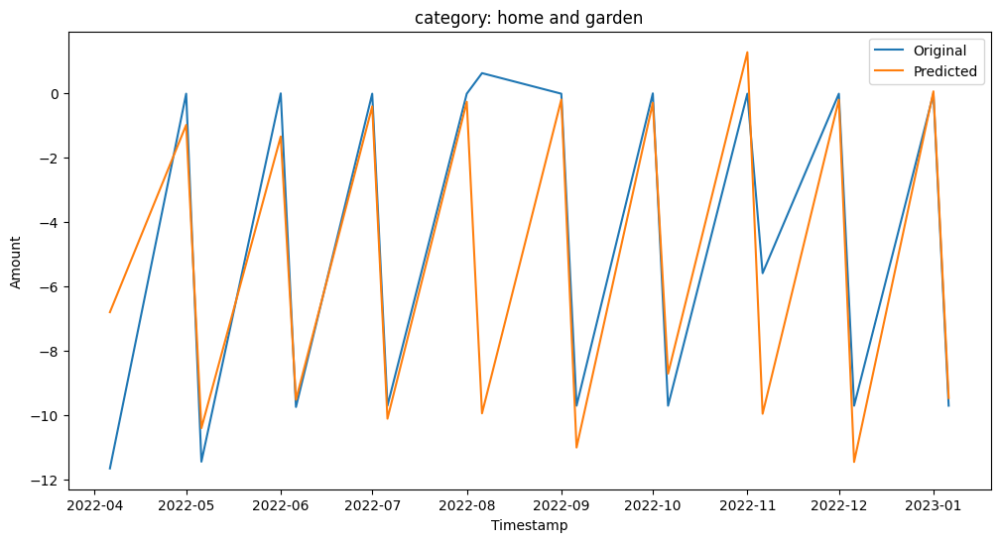

Best parameters for category home and garden: {'dropout_rate': 0.4, 'learn_rate': 0.01, 'neurons': 50}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 22ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


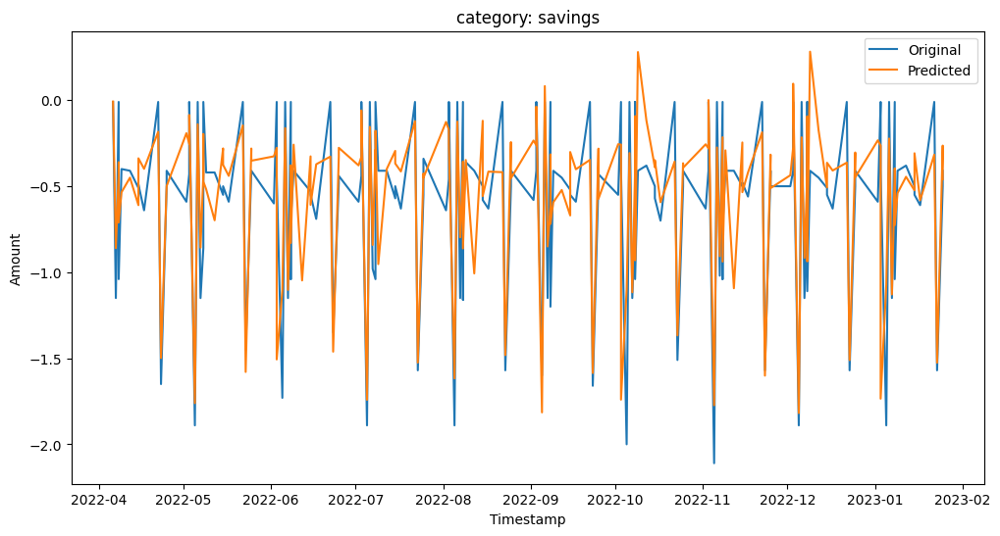

Best parameters for category savings: {'dropout_rate': 0.2, 'learn_rate': 0.01, 'neurons': 10}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 19ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


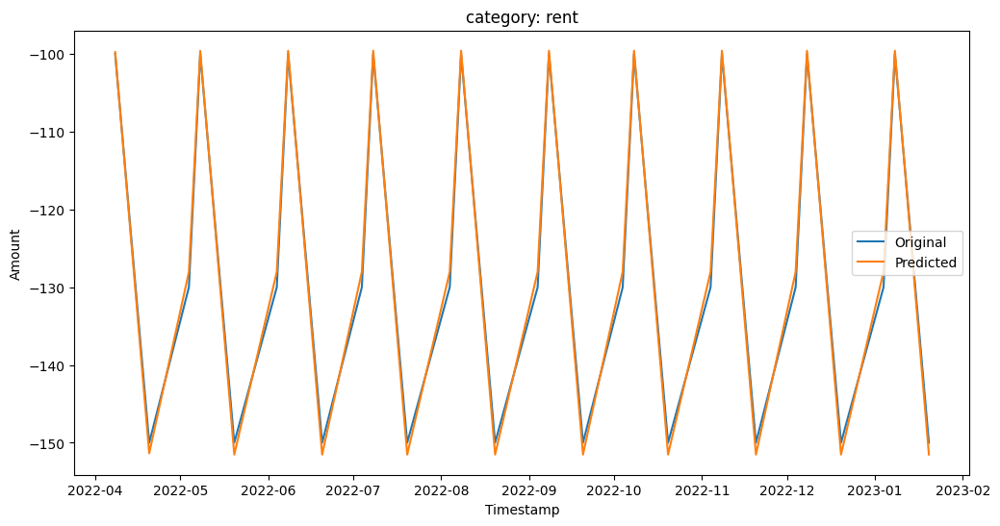

Best parameters for category rent: {'dropout_rate': 0.2, 'learn_rate': 0.01, 'neurons': 50}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 24ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


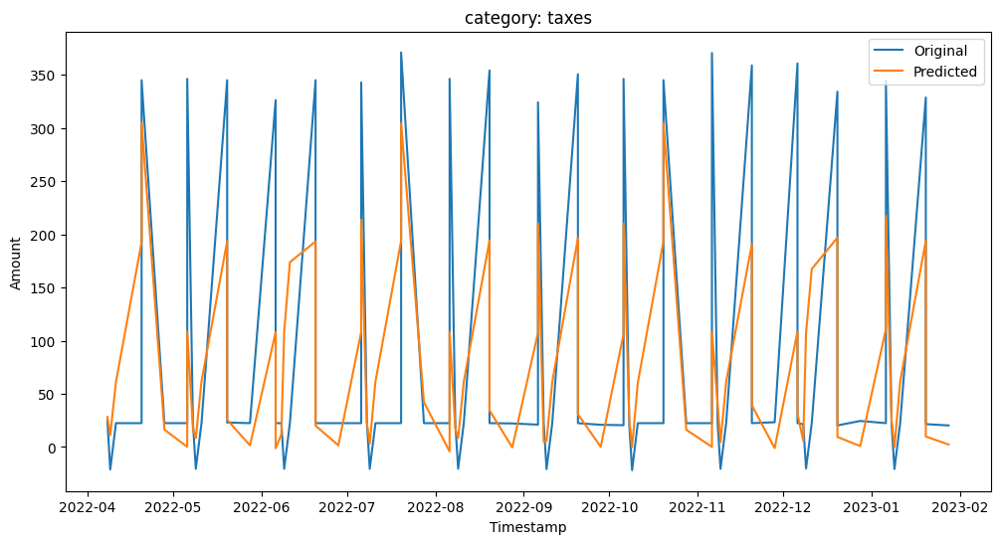

Best parameters for category taxes: {'dropout_rate': 0.4, 'learn_rate': 0.01, 'neurons': 10}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 22ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


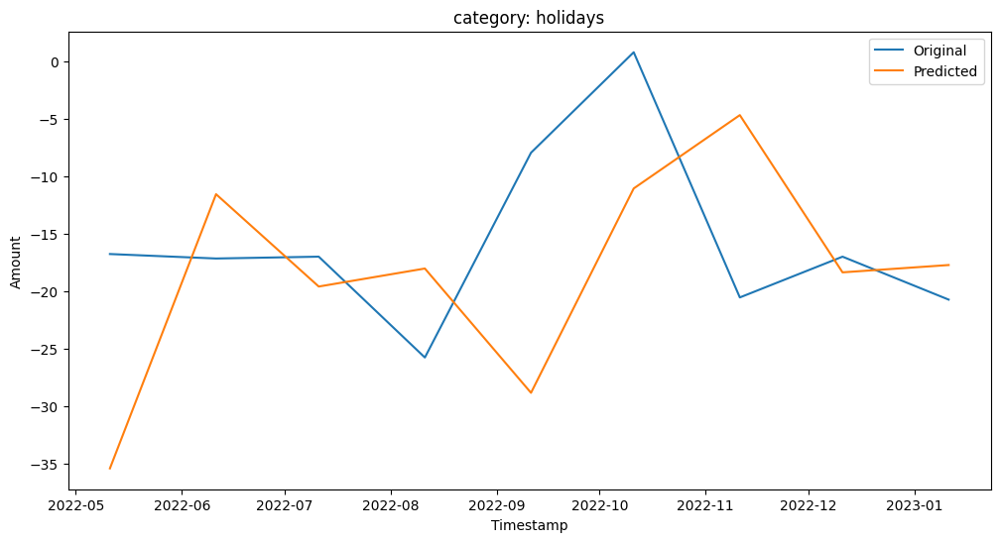

Best parameters for category holidays: {'dropout_rate': 0.4, 'learn_rate': 0.001, 'neurons': 100}


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 20ms/step


<ipython-input-9-01061f932c27>:69: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)


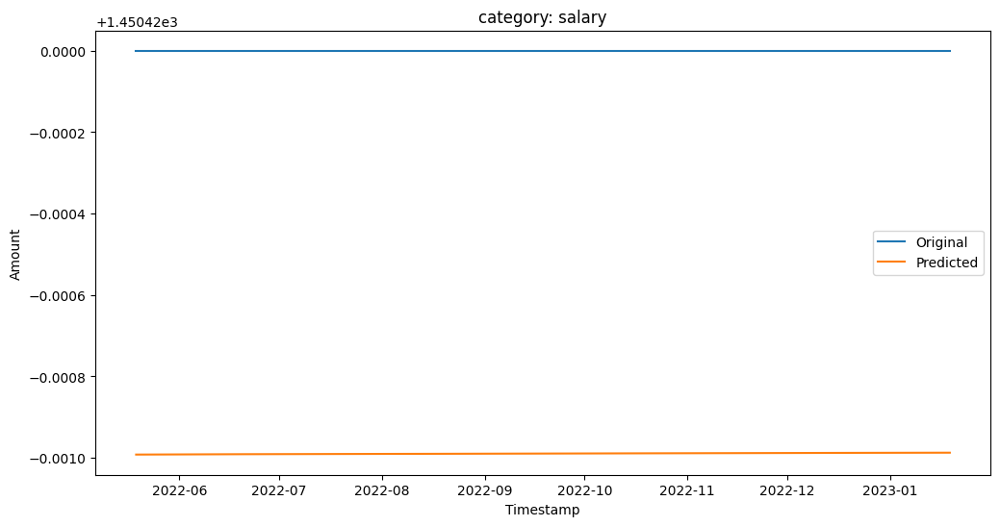

Best parameters for category salary: {'dropout_rate': 0.2, 'learn_rate': 0.1, 'neurons': 100}


,category,RMSE,MAE,MSE
0,bills and utilities,11.980786,9.133487,1.435392e+02
1,fees and charges,3.530357,2.197512,1.246342e+01
2,transfer,117.410394,83.487914,1.378520e+04
3,groceries / food spend,16.134441,12.047083,2.603202e+02
4,finances,33.001025,23.424629,1.089068e+03
5,shopping,15.620085,11.986942,2.439871e+02
6,restaurants / eating out / delivery,105.614888,84.266992,1.115450e+04
7,transport,8.138241,6.039728,6.623097e+01
8,business services,81.192682,63.163019,6.592252e+03
9,entertainment,34.797511,26.285647,1.210867e+03


In [ ]:
# wrap the model using the function you created
clf = KerasRegressor(build_fn=create_model, verbose=0, epochs=10, batch_size=1)

# create a dictionary of all values we want to test
param_grid = {'neurons': [10, 50, 100],
              'learn_rate': [0.001, 0.01, 0.1],
              'dropout_rate': [0.2, 0.3, 0.4]}

# use TimeSeriesSplit for cross-validation
tscv = TimeSeriesSplit(n_splits=3)

# use grid search to test all values
grid = GridSearchCV(clf, param_grid, cv=tscv)

# Metrics DataFrame
df_metrics_lstm = pd.DataFrame(columns=['category', 'RMSE', 'MAE', 'MSE'])

# Predictions DataFrame
df_preds_lstm = pd.DataFrame()

categories = df['category'].unique()
for i, cat in enumerate(categories):
    # Filter data by category
    df_cat = df[df['category'] == cat].sort_values('timestamp')
    df_cat.set_index('timestamp', inplace=True)
    df_cat = df_cat[['amount']]

    if len(df_cat) >= 30:
        # Define number of lags
        num_lags = 3

        # Transform data to be stationary
        supervised_values, raw_values = preprocess_data(df_cat, True, num_lags)

        # Split data into train and test-sets
        train_size = int(len(supervised_values) * 0.8)
        train, test = supervised_values[0:train_size], supervised_values[train_size:]

        # Transform the scale of the data
        scaler, train_scaled, test_scaled = scale(train, test)

        # Convert train_scaled to the shape needed for fitting
        X_train = train_scaled[:, 0:num_lags].reshape(train_scaled.shape[0], num_lags, 1)
        y_train = train_scaled[:, num_lags]

        # Fit the model using GridSearch
        grid_result = grid.fit(X_train, y_train)

        # Get the best model
        best_model = grid_result.best_estimator_.model

        # Walk-forward validation on the test data
        predictions = list()
        for i in range(len(test_scaled)):
            # Make one-step forecast
            X, y = test_scaled[i, 0:-1], test_scaled[i, -1]
            yhat = forecast_lstm(best_model, 1, X)
            # Invert scaling
            yhat = invert_scale(scaler, X, yhat)
            # Invert differencing
            yhat = inverse_difference(raw_values, yhat, len(test_scaled) + 1 - i)
            # Store forecast
            predictions.append(yhat)

        rmse = sqrt(mean_squared_error(raw_values[-len(predictions):], predictions))
        mae = mean_absolute_error(raw_values[-len(predictions):], predictions)
        mse = mean_squared_error(raw_values[-len(predictions):], predictions)

        df_metrics_lstm = df_metrics_lstm.append({'category': cat, 'RMSE': rmse, 'MAE': mae, 'MSE': mse}, ignore_index=True)
        df_pred = pd.DataFrame({'timestamp': df_cat.index[-len(predictions):], 'amount': predictions, 'category': cat})
        df_preds_lstm = pd.concat([df_preds_lstm, df_pred], ignore_index=True)

        # Plot the original series and the predicted values
        plt.figure(figsize=(12, 6))
        plt.plot(df_cat.index[-len(predictions):], raw_values[-len(predictions):], label='Original')
        plt.plot(df_cat.index[-len(predictions):], predictions, label='Predicted')
        plt.title(f'category: {cat}')
        plt.xlabel('Timestamp')
        plt.ylabel('Amount')
        plt.legend()
        plt.show()

        # Print out the best parameters
        print(f"Best parameters for category {cat}: {grid_result.best_params_}")

df_metrics_lstm


# XGBoost Model

In [ ]:
# define a function to convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols = list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    # put it all together
    agg = pd.concat(cols, axis=1)
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg.values


# define the xgboost model function
def xgboost_forecast(train, test, n_lag):
    train = series_to_supervised(train, n_lag)
    test = series_to_supervised(test, n_lag)
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]

    # define the parameter grid
    param_grid = {
        'n_estimators': [50, 100, 200],  # number of trees in the forest
        'max_depth': [2, 5, 10],  # maximum depth of the tree
        'learning_rate': [0.01, 0.1, 0.2],  # learning rate
        'subsample': [0.5, 1],  # fraction of observations to be randomly sampled for each tree
        'colsample_bytree': [0.5, 1]  # fraction of columns to be randomly sampled for each tree
    }

    # define the model
    model = xgb.XGBRegressor(objective ='reg:squarederror')

    # define the grid search
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')

    # fit the grid search
    grid_search.fit(train_X, train_y)

    # summarize the best configuration
    print(f"Best: {grid_search.best_score_} using {grid_search.best_params_}")

    # refit the model with best parameters
    model = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_)
    model.fit(train_X, train_y)

    # make a one-step prediction
    predictions = model.predict(test_X)

    return predictions

# Get list of unique categories
categories = df['category'].unique()

n_lag = 20
n_forecast = 20



Processing category: bills and utilities
Best: -23.24447972559412 using {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1}
MSE: 44.78174147702006, RMSE: 6.691916128958884, MAE: 4.136934752383475


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


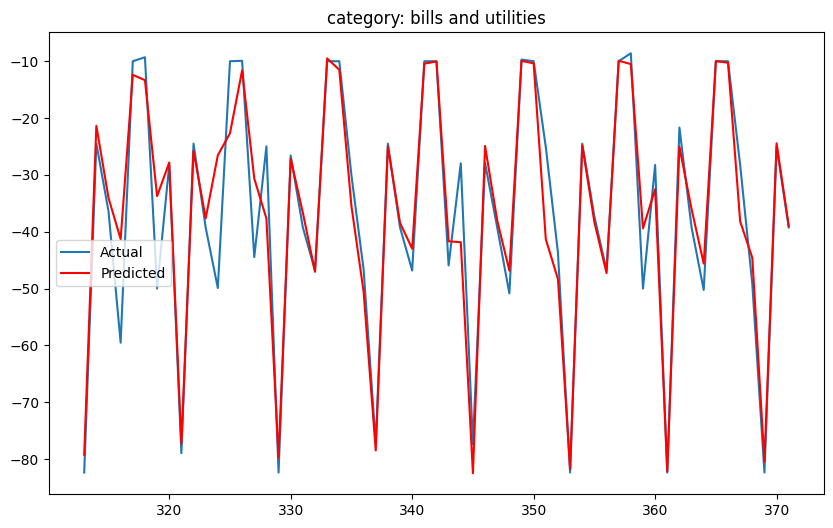

Processing category: fees and charges
Best: -13.050565241023335 using {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.5}
MSE: 4.223060617751953, RMSE: 2.0550086661014237, MAE: 0.8207100053038449


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


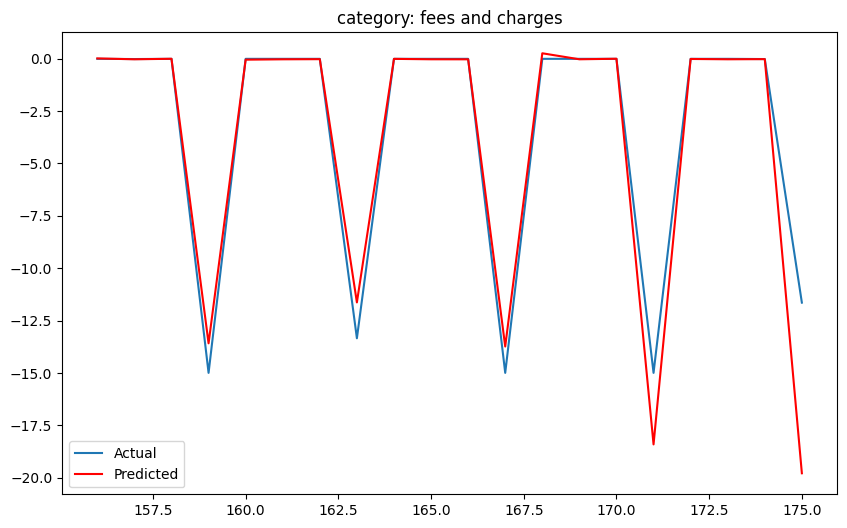

Processing category: transfer
Best: -5359.986570809215 using {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 200, 'subsample': 1}
MSE: 4504.951785311876, RMSE: 67.1189376056555, MAE: 42.0333427657702


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


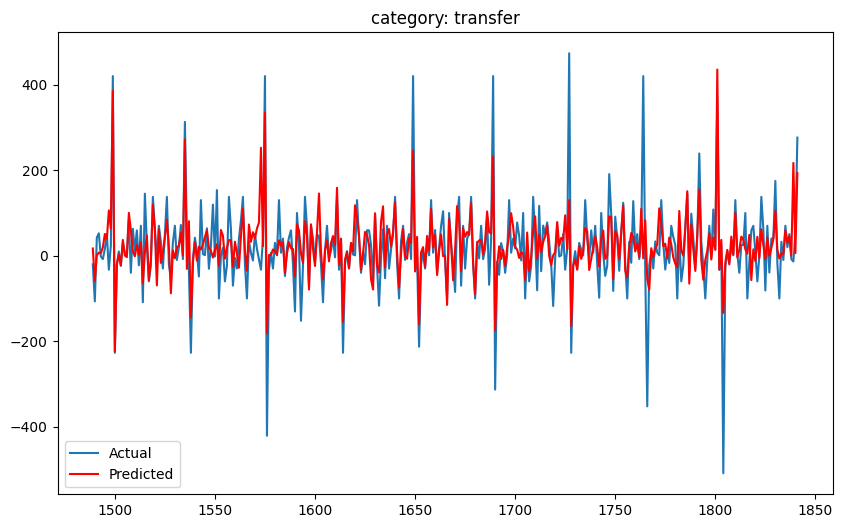

Processing category: groceries / food spend
Best: -169.26704671824177 using {'colsample_bytree': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1}
MSE: 179.11994031995107, RMSE: 13.383569789856184, MAE: 8.284402375509174


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


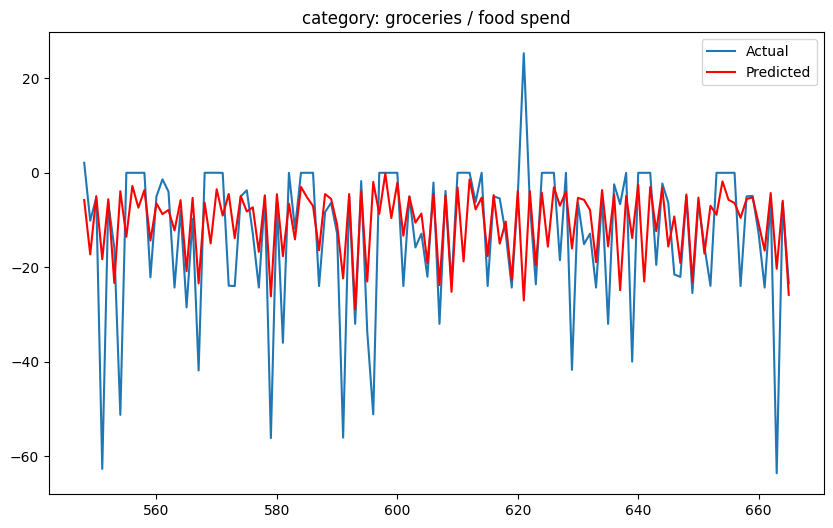

Processing category: finances
Best: -239.06343935838973 using {'colsample_bytree': 1, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 50, 'subsample': 0.5}
MSE: 232.7872907960716, RMSE: 15.257368409921535, MAE: 8.039219657656716


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


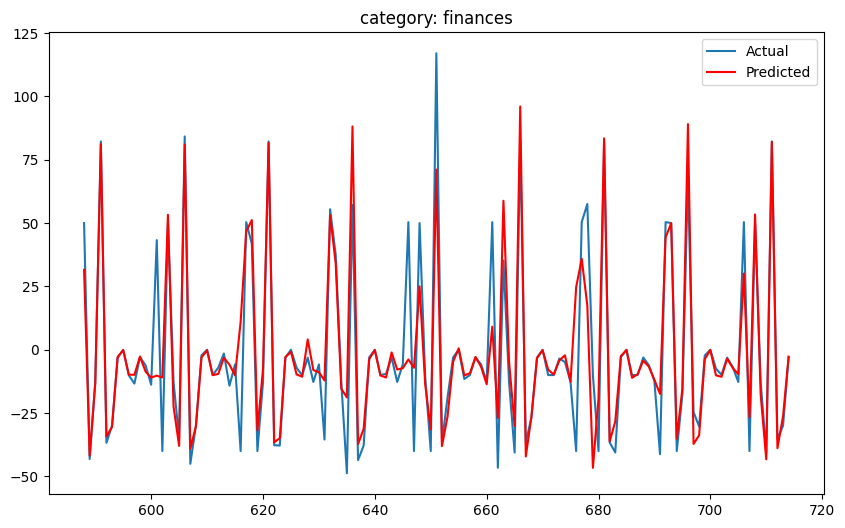

Processing category: shopping
Best: -162.00598969145005 using {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1}
MSE: 156.40528791918211, RMSE: 12.506209974216095, MAE: 8.118430387588749


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


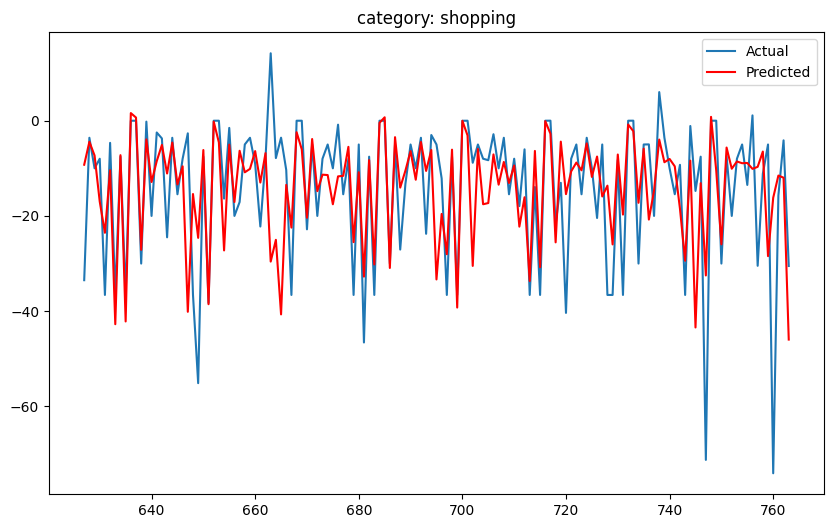

Processing category: restaurants / eating out / delivery
Not enough data for category: restaurants / eating out / delivery
Processing category: transport
Best: -15.715418220088202 using {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 50, 'subsample': 1}
MSE: 13.812695266197945, RMSE: 3.7165434567885716, MAE: 2.398359665444919


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


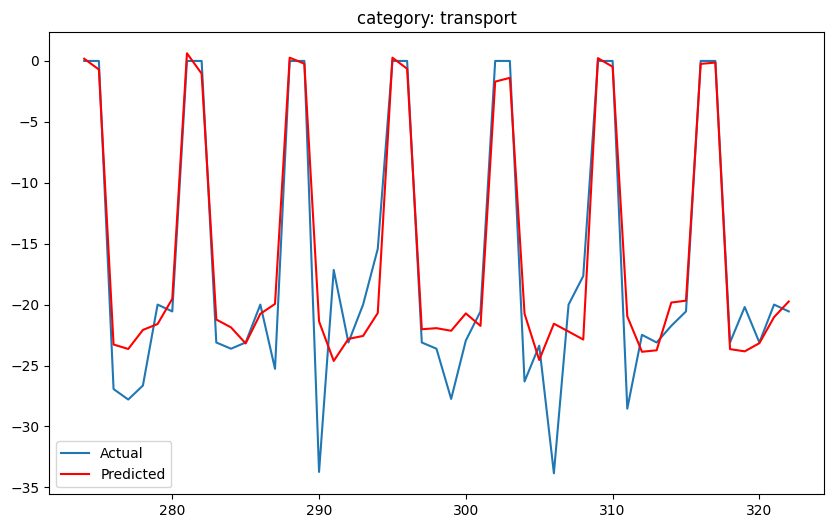

Processing category: business services
Best: -6294.825629359623 using {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 50, 'subsample': 1}
MSE: 2767.598593361674, RMSE: 52.607970815853314, MAE: 29.77184986305237


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


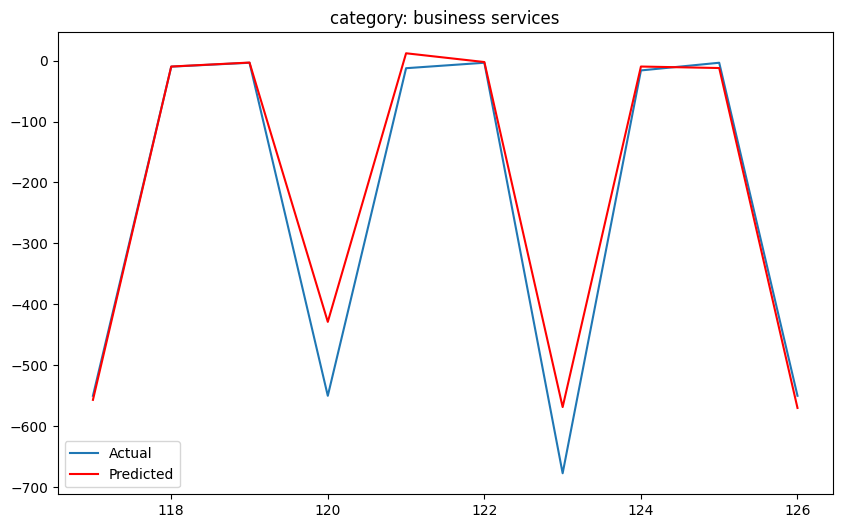

Processing category: entertainment
Best: -387.2928452782676 using {'colsample_bytree': 0.5, 'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 200, 'subsample': 0.5}
MSE: 716.6749530628654, RMSE: 26.7707854397824, MAE: 17.836078360728592


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


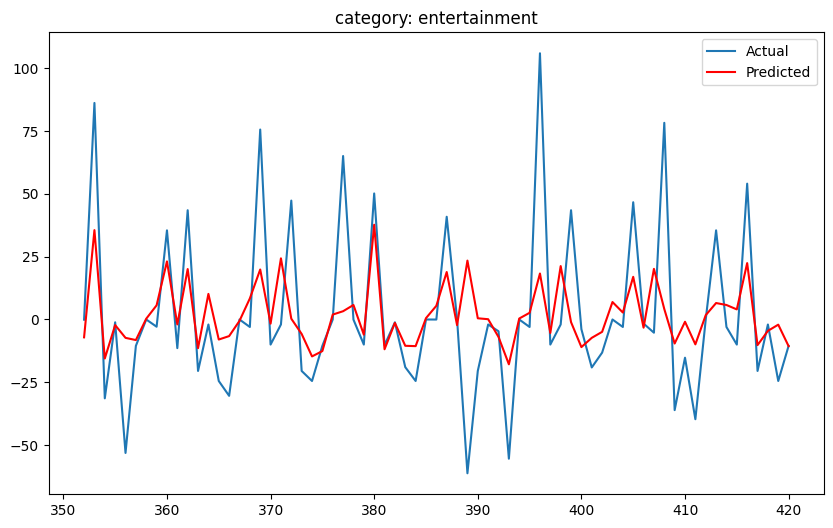

Processing category: home and garden
Not enough data for category: home and garden
Processing category: savings
Best: -0.022852008733783746 using {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 50, 'subsample': 1}
MSE: 0.027678611847689313, RMSE: 0.16636890288659512, MAE: 0.08921802159214902


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


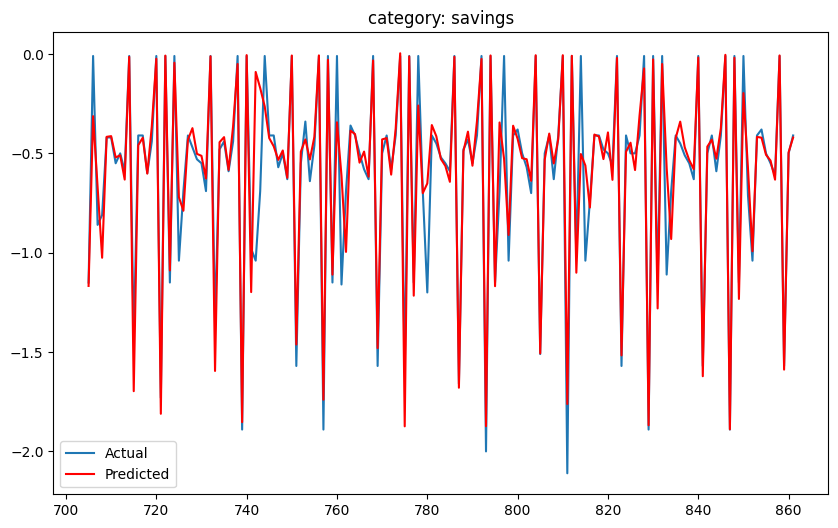

Processing category: rent
Best: -1.618860147169067e-08 using {'colsample_bytree': 0.5, 'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 100, 'subsample': 1}
MSE: 1.103617250919342e-08, RMSE: 0.00010505318895299381, MAE: 9.1552734375e-05


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


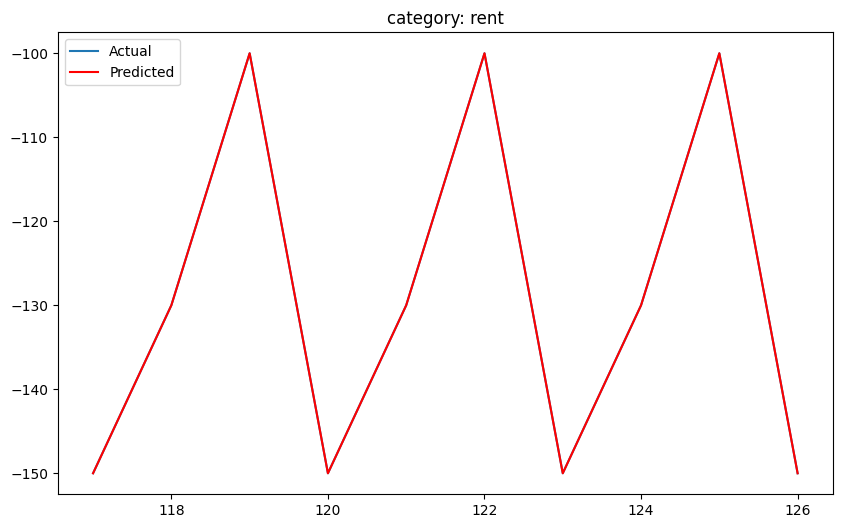

Processing category: taxes
Best: -6089.650771456033 using {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 100, 'subsample': 0.5}
MSE: 10288.436693780188, RMSE: 101.43193133220025, MAE: 61.141230406720766


<ipython-input-13-2e60d61f7b9c>:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


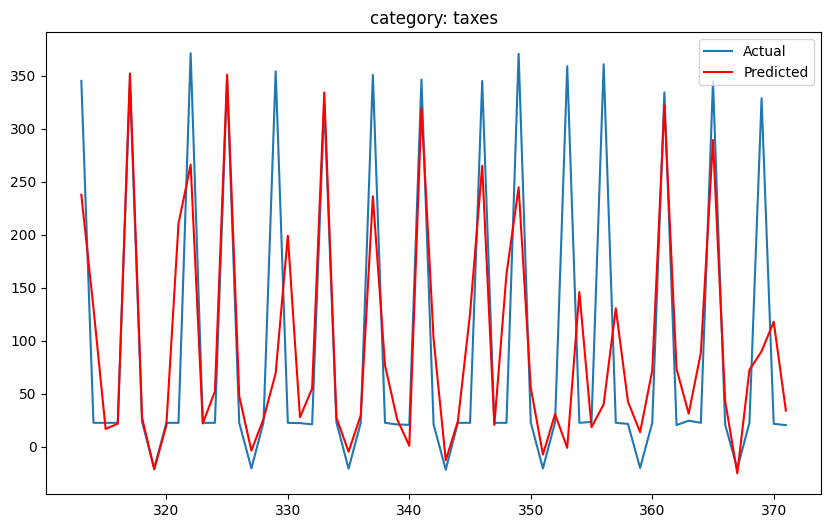

Processing category: holidays
Not enough data for category: holidays
Processing category: salary
Not enough data for category: salary


,category,MSE,RMSE,MAE
0,bills and utilities,4.478174e+01,6.691916,4.136935
1,fees and charges,4.223061e+00,2.055009,0.820710
2,transfer,4.504952e+03,67.118938,42.033343
3,groceries / food spend,1.791199e+02,13.383570,8.284402
4,finances,2.327873e+02,15.257368,8.039220
5,shopping,1.564053e+02,12.506210,8.118430
6,transport,1.381270e+01,3.716543,2.398360
7,business services,2.767599e+03,52.607971,29.771850
8,entertainment,7.166750e+02,26.770785,17.836078
9,savings,2.767861e-02,0.166369,0.089218


In [ ]:
# Create an empty DataFrame to store evaluation metrics
df_metrics_boost = pd.DataFrame(columns=['category', 'MSE', 'RMSE', 'MAE'])

# Iterate over categories and apply XGBoost
for category in categories:
    print(f"Processing category: {category}")
    df_cat = df[df['category'] == category][['amount']].copy()

    # Create train-test split
    train_size = int(len(df_cat) * 0.8)
    train, test = df_cat[0:train_size], df_cat[train_size:]

    # Check if enough observations are present
    if len(train) > n_lag and len(test) > n_forecast:
        # Apply model
        predictions = xgboost_forecast(train.values, test.values, n_lag)

        # Prepare for plotting
        test_y = series_to_supervised(test.values, n_lag)[:, -1]

        # Calculate evaluation metrics
        mse = mean_squared_error(test_y, predictions)
        mae = mean_absolute_error(test_y, predictions)
        rmse = np.sqrt(mse)
        print(f'MSE: {mse}, RMSE: {rmse}, MAE: {mae}')

        # Store evaluation metrics in a DataFrame
        df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)

        # Plot the actual vs predicted values
        plt.figure(figsize=(10,6))
        plt.plot(np.arange(len(train), len(train) + len(test_y)), test_y, label='Actual')
        plt.plot(np.arange(len(train), len(train) + len(predictions)), predictions, color='red', label='Predicted')
        plt.title(f'category: {category}')
        plt.legend()
        plt.show()
    else:
        print(f"Not enough data for category: {category}")

# Print the final metrics DataFrame
df_metrics_boost

In [ ]:
# Add a 'model' column to each DataFrame
df_metrics_arima['model'] = 'ARIMA'
df_metrics_sarima['model'] = 'SARIMA'
df_metrics_lstm['model'] = 'LSTM'
df_metrics_boost['model'] = 'Boosting'


In [ ]:
df_metrics_arima

,category,RMSE,MAE,MSE,model
0,bills and utilities,19.427341,15.723987,3.774216e+02,ARIMA
1,fees and charges,2.116536,0.935996,4.479727e+00,ARIMA
2,transfer,93.264780,61.238489,8.698319e+03,ARIMA
3,groceries / food spend,15.186948,11.711653,2.306434e+02,ARIMA
4,finances,29.313381,22.927344,8.592743e+02,ARIMA
5,shopping,14.214213,10.918982,2.020439e+02,ARIMA
6,restaurants / eating out / delivery,79.354103,58.568154,6.297074e+03,ARIMA
7,transport,8.473828,7.404175,7.180576e+01,ARIMA
8,business services,83.246126,47.949393,6.929918e+03,ARIMA
9,entertainment,30.140525,21.380735,9.084513e+02,ARIMA


In [ ]:
df_metrics_sarima

,category,RMSE,MAE,MSE,model
0,bills and utilities,22.986664,18.356551,5.283867e+02,SARIMA
1,fees and charges,3.120464,1.971173,9.737297e+00,SARIMA
2,transfer,107.436640,75.625783,1.154263e+04,SARIMA
3,groceries / food spend,17.611378,12.241722,3.101606e+02,SARIMA
4,finances,34.054589,27.595727,1.159715e+03,SARIMA
5,shopping,16.228109,11.577451,2.633515e+02,SARIMA
6,restaurants / eating out / delivery,113.654334,91.439367,1.291731e+04,SARIMA
7,transport,3.538527,2.273504,1.252117e+01,SARIMA
8,business services,81.347280,50.398940,6.617380e+03,SARIMA
9,entertainment,37.581729,28.783404,1.412386e+03,SARIMA


In [ ]:
df_metrics_lstm

,category,RMSE,MAE,MSE,model
0,bills and utilities,35.586451,29.989062,1266.395462,LSTM
1,fees and charges,11.701909,9.426819,136.934671,LSTM
2,transfer,159.340581,115.162498,25389.420703,LSTM
3,groceries / food spend,30.005322,24.136915,900.319366,LSTM
4,finances,56.132914,39.184534,3150.904066,LSTM
5,shopping,22.914069,18.186070,525.054561,LSTM
6,restaurants / eating out / delivery,137.534827,105.939158,18915.828645,LSTM
7,transport,16.859396,13.313743,284.239225,LSTM
8,business services,513.910721,421.661806,264104.229284,LSTM
9,entertainment,47.136338,36.549434,2221.834401,LSTM


In [ ]:
df_metrics_boost

,category,MSE,RMSE,MAE,model
0,bills and utilities,4.478174e+01,6.691916,4.136935,Boosting
1,fees and charges,4.223061e+00,2.055009,0.820710,Boosting
2,transfer,4.504952e+03,67.118938,42.033343,Boosting
3,groceries / food spend,1.791199e+02,13.383570,8.284402,Boosting
4,finances,2.327873e+02,15.257368,8.039220,Boosting
5,shopping,1.564053e+02,12.506210,8.118430,Boosting
6,transport,1.381270e+01,3.716543,2.398360,Boosting
7,business services,2.767599e+03,52.607971,29.771850,Boosting
8,entertainment,7.166750e+02,26.770785,17.836078,Boosting
9,savings,2.767861e-02,0.166369,0.089218,Boosting


In [ ]:
# Merge the DataFrames
df_all_metrics = pd.concat([df_metrics_arima, df_metrics_sarima, df_metrics_lstm, df_metrics_boost], axis=0)

In [ ]:
df_all_metrics

,category,RMSE,MAE,MSE,model
0,bills and utilities,19.427341,15.723987,3.774216e+02,ARIMA
1,fees and charges,2.116536,0.935996,4.479727e+00,ARIMA
2,transfer,93.264780,61.238489,8.698319e+03,ARIMA
3,groceries / food spend,15.186948,11.711653,2.306434e+02,ARIMA
4,finances,29.313381,22.927344,8.592743e+02,ARIMA
5,shopping,14.214213,10.918982,2.020439e+02,ARIMA
6,restaurants / eating out / delivery,79.354103,58.568154,6.297074e+03,ARIMA
7,transport,8.473828,7.404175,7.180576e+01,ARIMA
8,business services,83.246126,47.949393,6.929918e+03,ARIMA
9,entertainment,30.140525,21.380735,9.084513e+02,ARIMA


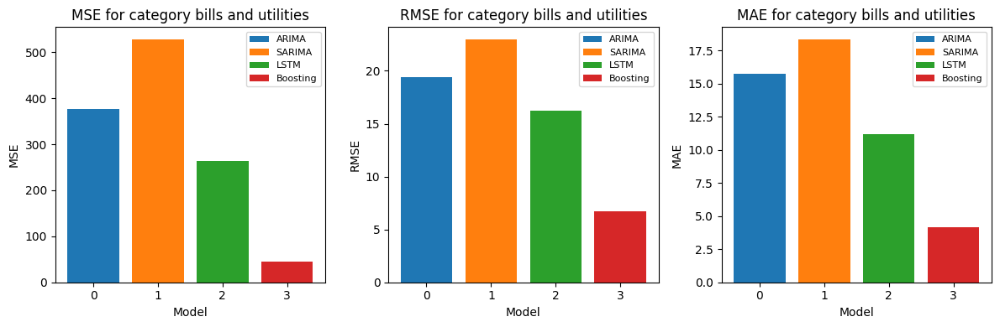

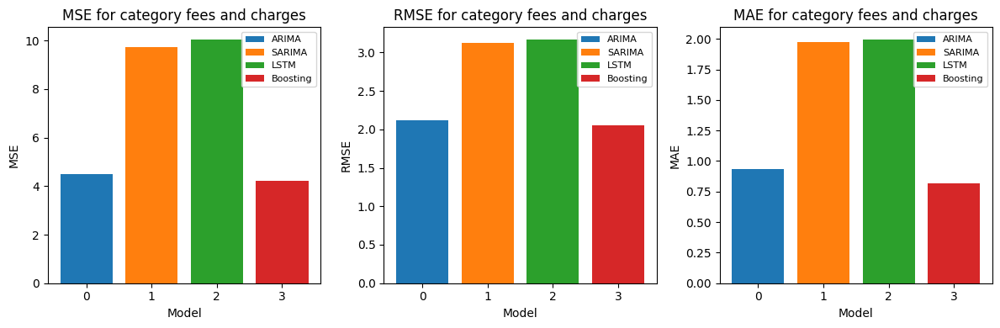

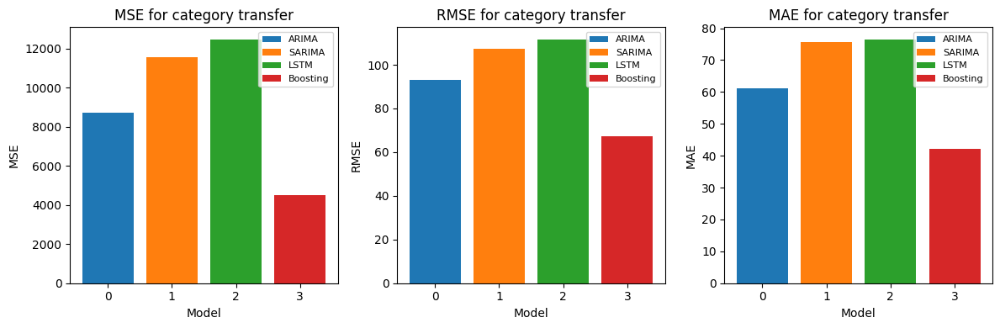

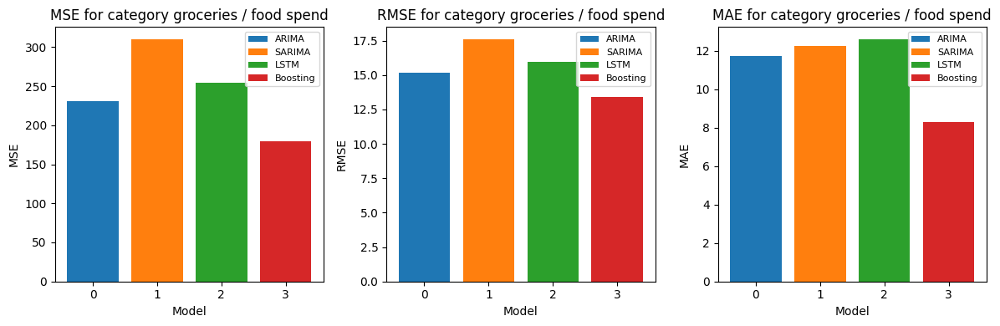

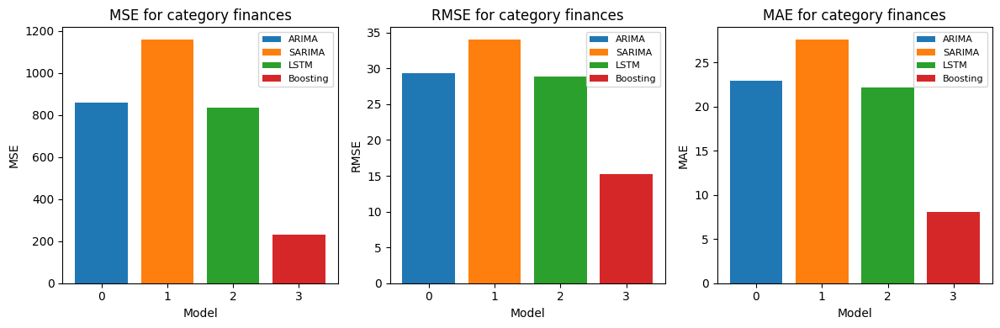

...

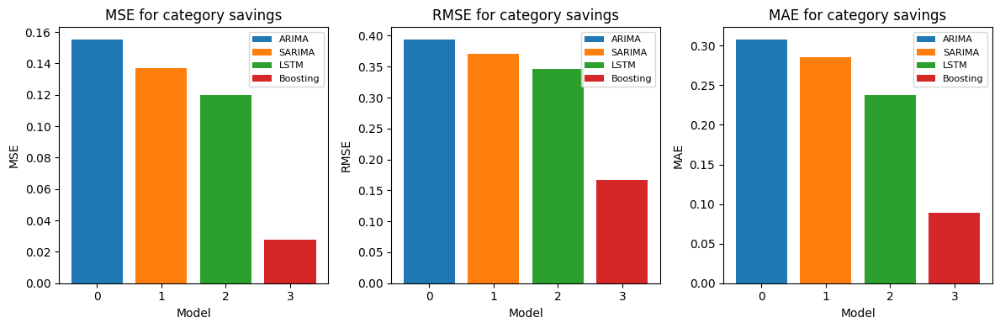

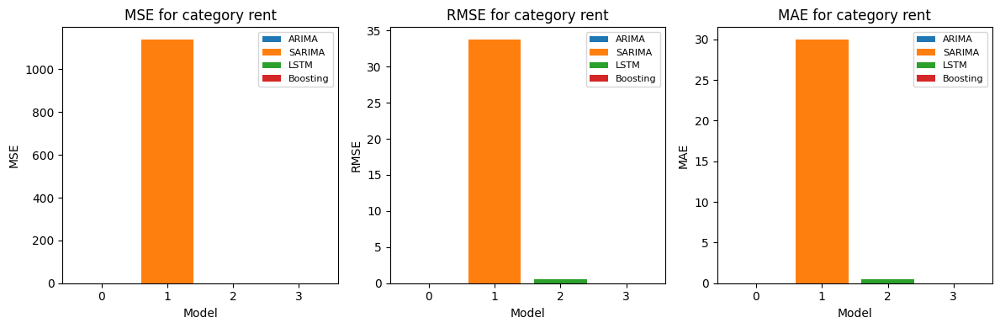

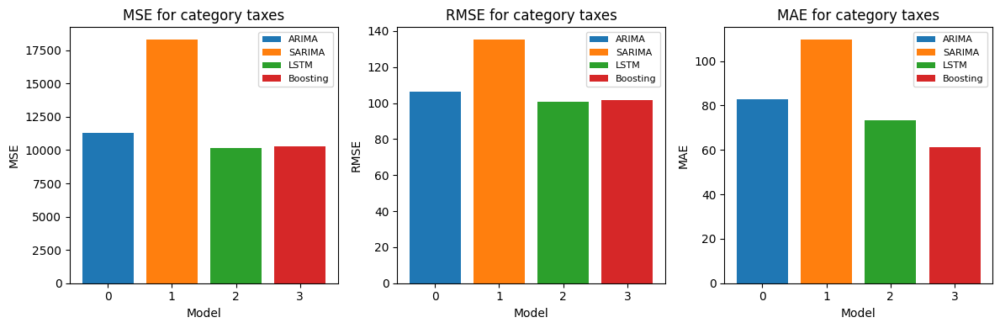

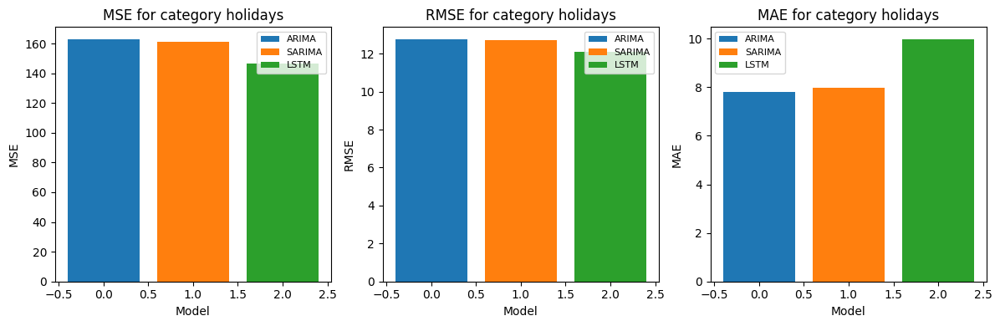

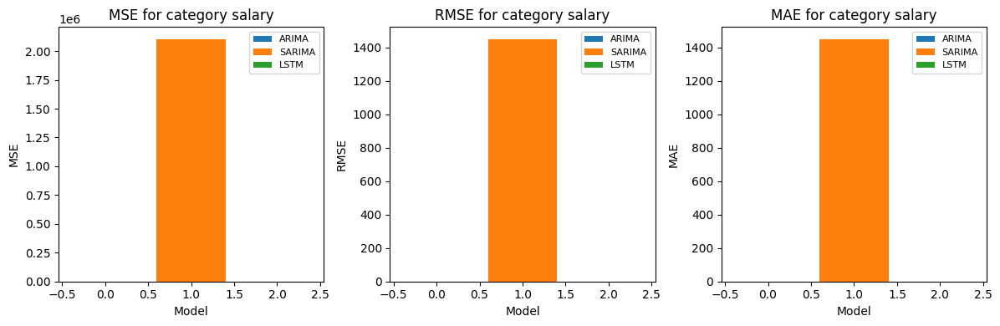

In [ ]:
# Define the metrics and models
metrics = ['MSE', 'RMSE', 'MAE']
models = ['ARIMA', 'SARIMA', 'LSTM', 'Boosting']

# For each category
for category in df_all_metrics['category'].unique():

    # Filter the DataFrame for the current category
    df_category = df_all_metrics[df_all_metrics['category'] == category]

    # Create a new figure with 3 subplots, all in the same row
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    # For each metric
    for i, metric in enumerate(metrics):

        # For each model
        for j, model in enumerate(models):

            # Check if the data for the current model, metric, and category combination exists
            if (df_category['model'] == model).any():

                # Extract the value for the current metric and model
                value = df_category.loc[df_category['model'] == model, metric].values[0]

                # Add a bar to the plot
                axs[i].bar(j, value, label=model)

        # Add a title and labels to the plot
        axs[i].set_title(f"{metric} for category {category}")
        axs[i].set_xlabel("Model")
        axs[i].set_ylabel(metric)

        # Add a legend with reduced font size
        axs[i].legend(prop={'size': 8})

    # Adjust the layout
    plt.tight_layout()

    # Show the plot
    plt.show()


In [ ]:
df_all_metrics.to_csv('all_metrics.csv', index=False)


In [ ]:
df_metrics_lstm.to_csv('df_lstm.csv', index = False)

Processing category: bills and utilities
MSE: 66.63862338321319, RMSE: 8.163248335265392, MAE: 4.544061592231363


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


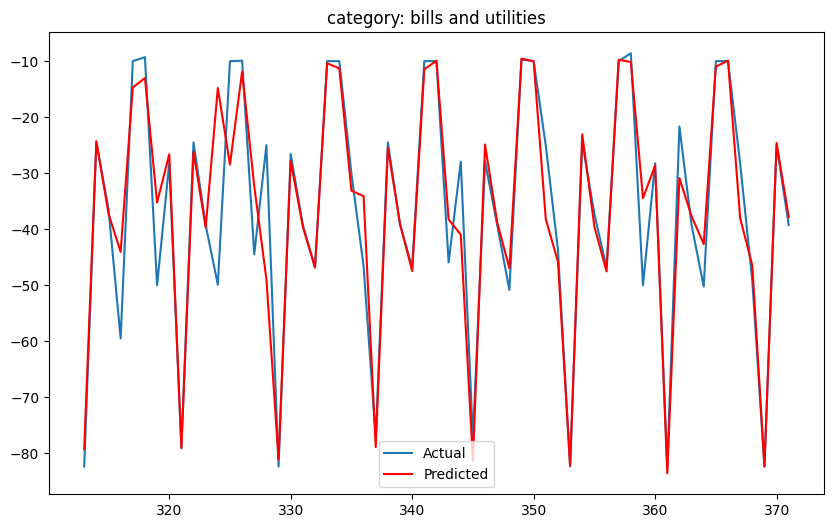

Processing category: fees and charges
MSE: 4.852010946707543, RMSE: 2.2027280691695794, MAE: 0.8775182101607788


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


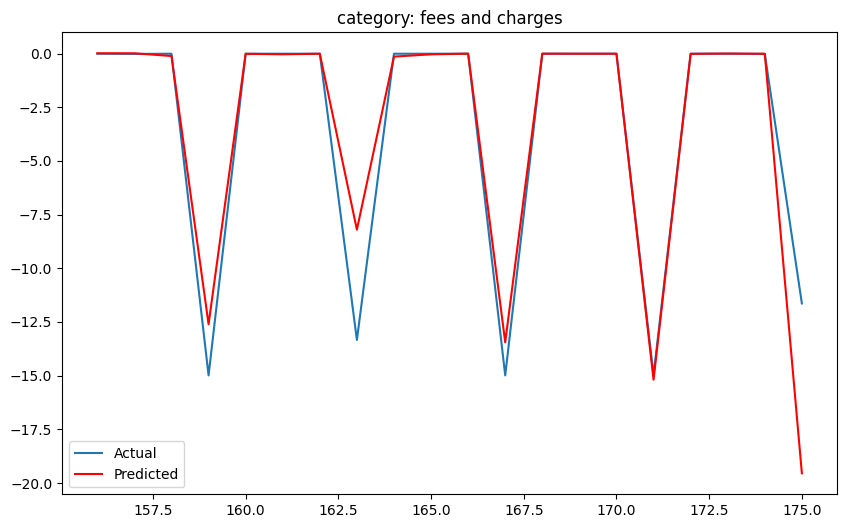

Processing category: transfer
MSE: 5201.747799065946, RMSE: 72.12314329718268, MAE: 44.33091329348408


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


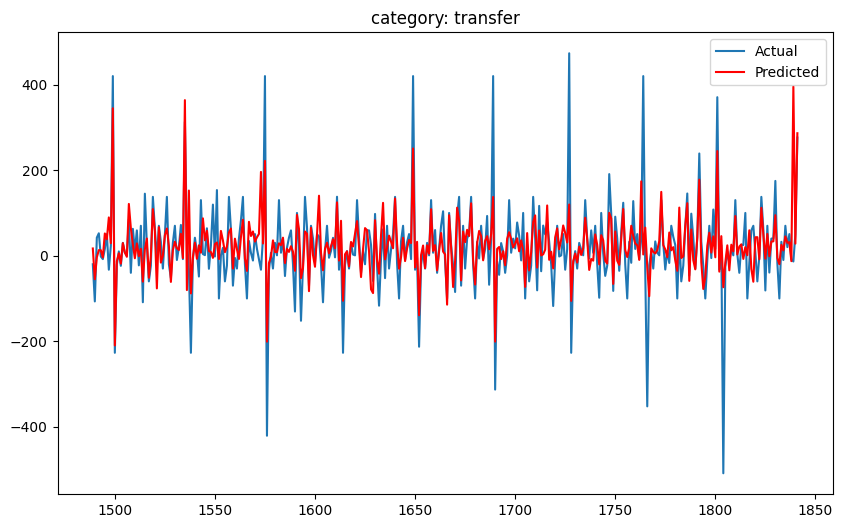

Processing category: groceries / food spend
MSE: 175.14153338331892, RMSE: 13.234104933213992, MAE: 8.245861491752882


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


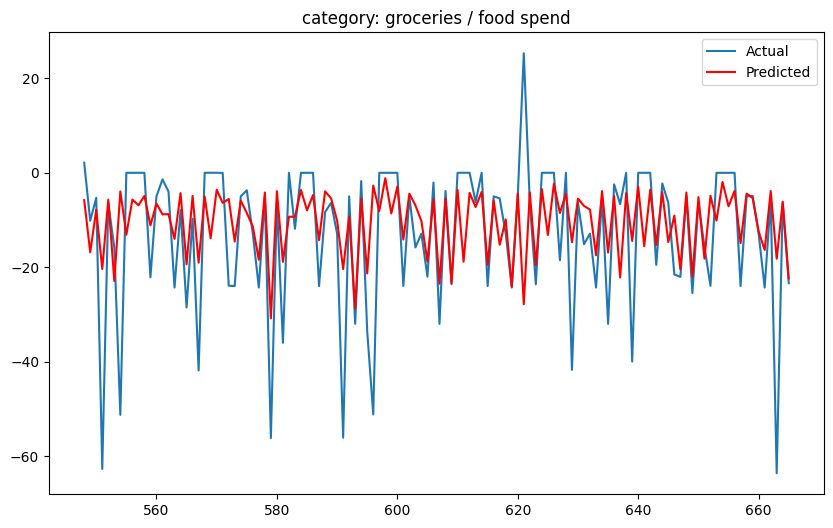

Processing category: finances
MSE: 245.61627081217213, RMSE: 15.672149527495332, MAE: 8.790709440958079


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


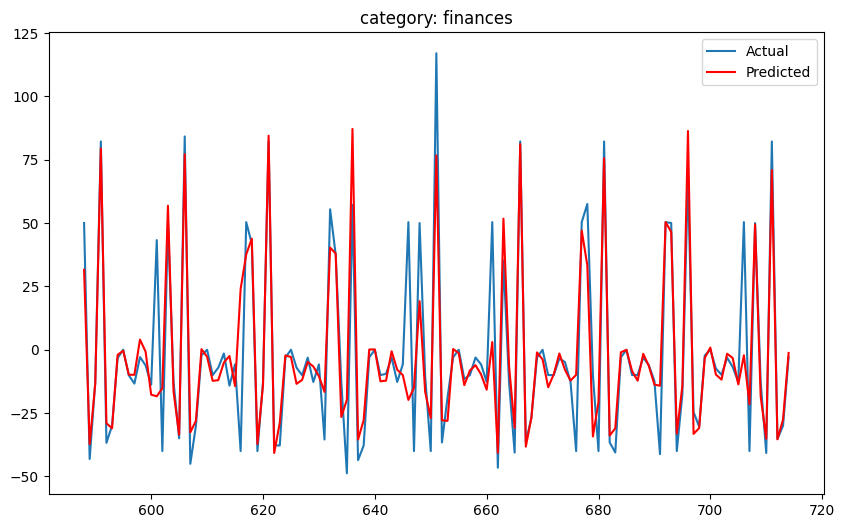

Processing category: shopping
MSE: 156.86395438330786, RMSE: 12.524534098452838, MAE: 8.33998097661203


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


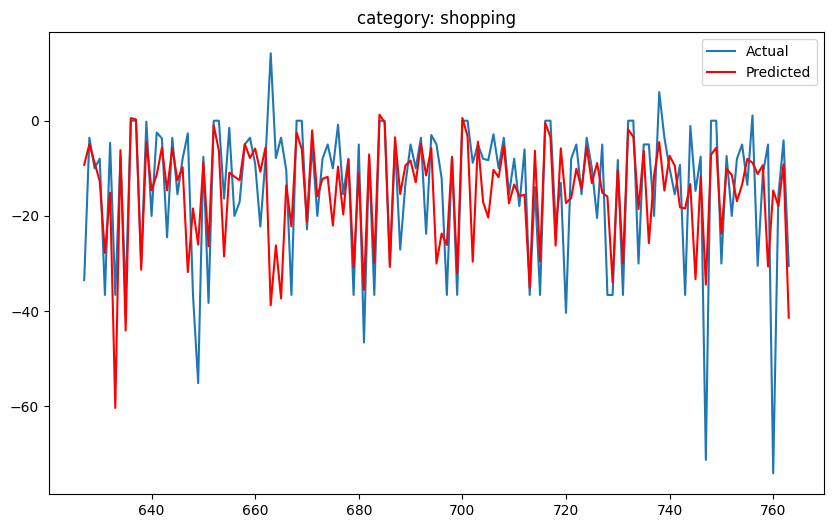

Processing category: restaurants / eating out / delivery
Not enough data for category: restaurants / eating out / delivery
Processing category: transport
MSE: 14.39939493637666, RMSE: 3.7946534672321084, MAE: 2.434055989246283


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


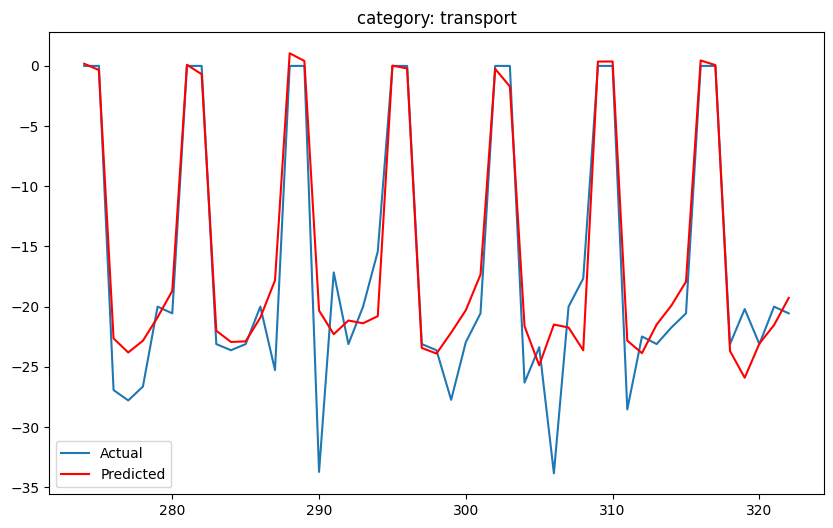

Processing category: business services
MSE: 10421.341736763336, RMSE: 102.08497311927616, MAE: 47.624171773910525


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


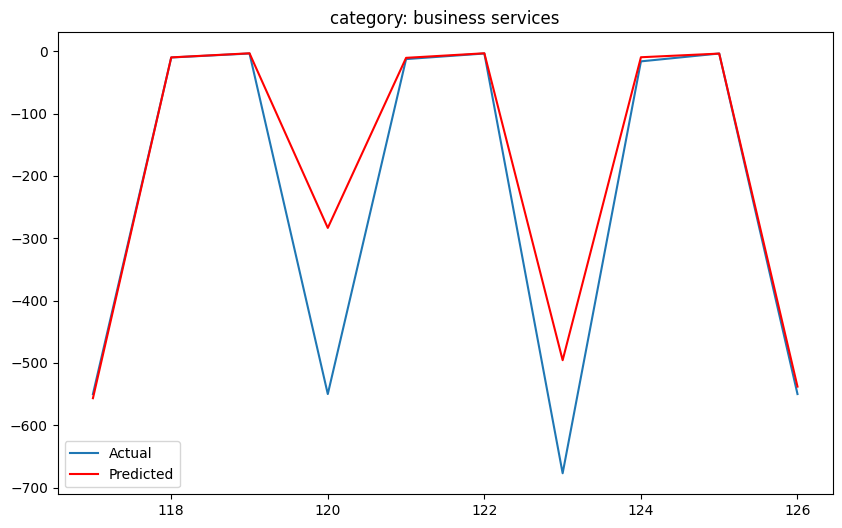

Processing category: entertainment
MSE: 673.9338549227189, RMSE: 25.960236033648055, MAE: 18.138429030668043


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


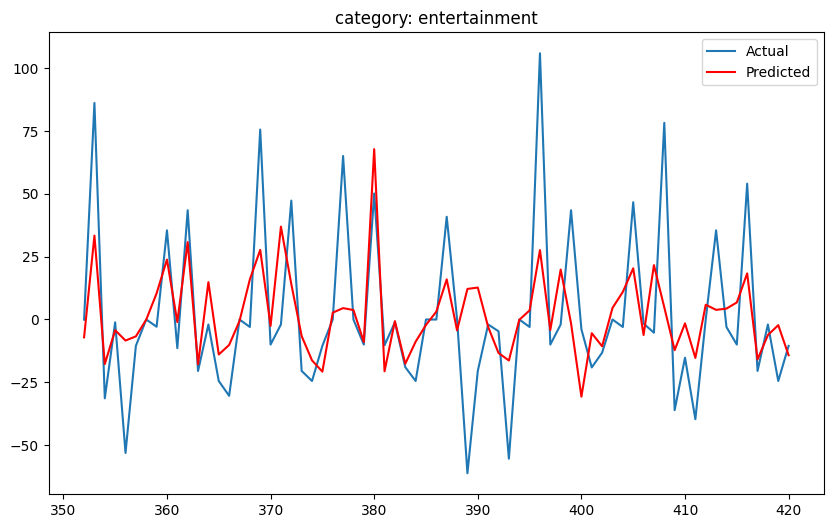

Processing category: home and garden
Not enough data for category: home and garden
Processing category: savings
MSE: 0.026250309384383656, RMSE: 0.16201947223831972, MAE: 0.0856116492218771


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


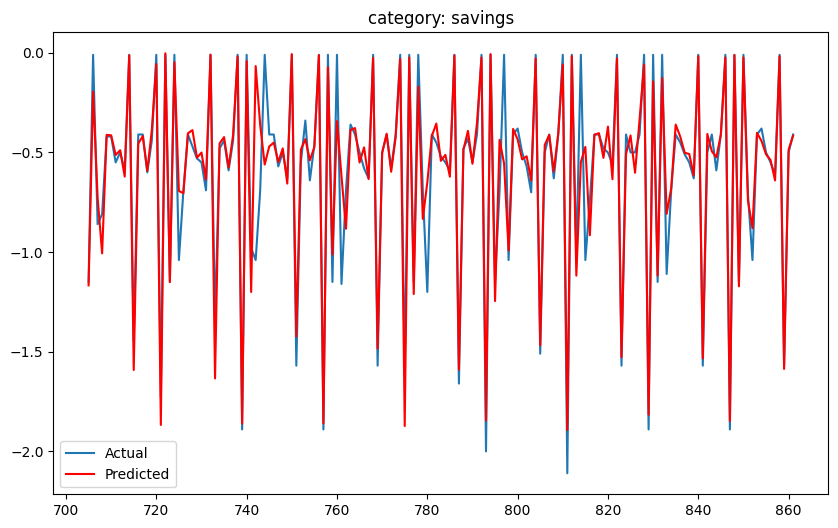

Processing category: rent
MSE: 1.3166572898626327e-08, RMSE: 0.00011474568793042432, MAE: 9.918212890625e-05


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


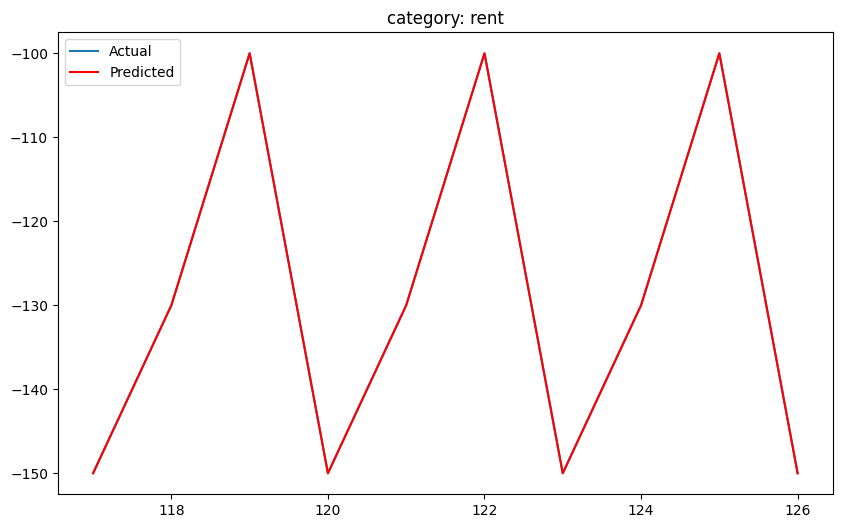

Processing category: taxes
MSE: 9140.9186430569, RMSE: 95.60815155130288, MAE: 54.82796297978547


<ipython-input-9-72ae15850799>:95: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)


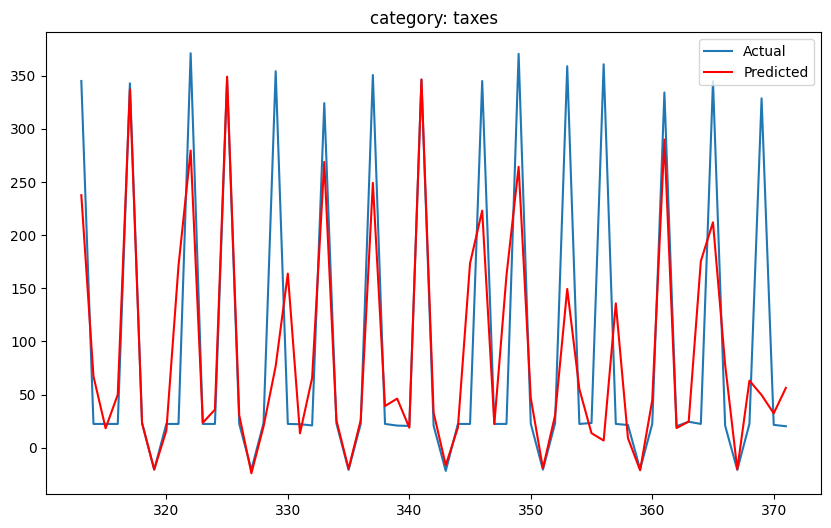

Processing category: holidays
Not enough data for category: holidays
Processing category: salary
Not enough data for category: salary


,category,RMSE,MAE,MSE
0,bills and utilities,8.163248,4.544062,6.663862e+01
1,fees and charges,2.202728,0.877518,4.852011e+00
2,transfer,72.123143,44.330913,5.201748e+03
3,groceries / food spend,13.234105,8.245861,1.751415e+02
4,finances,15.672150,8.790709,2.456163e+02
5,shopping,12.524534,8.339981,1.568640e+02
6,transport,3.794653,2.434056,1.439939e+01
7,business services,102.084973,47.624172,1.042134e+04
8,entertainment,25.960236,18.138429,6.739339e+02
9,savings,0.162019,0.085612,2.625031e-02


In [ ]:
'''

XGBoost with validation


# define a function to convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols = list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    # put it all together
    agg = pd.concat(cols, axis=1)
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg.values

def xgboost_forecast(train, test, n_lag, param_grid):
    predictions = []
    for t in range(len(test) - n_lag):
        train_temp = train.copy()
        test_temp = test[t:t + n_lag + 1]

        train_temp = series_to_supervised(train_temp, n_lag)
        test_temp = series_to_supervised(test_temp, n_lag)
        train_X, train_y = train_temp[:, :-1], train_temp[:, -1]
        test_X, test_y = test_temp[:, :-1], test_temp[:, -1]

        # define the parameter grid
        param_grid = {
            'n_estimators': [50, 100, 200],  # number of trees in the forest
            'max_depth': [2, 5, 10],  # maximum depth of the tree
            'learning_rate': [0.01, 0.1, 0.2],  # learning rate
            'subsample': [0.5, 1],  # fraction of observations to be randomly sampled for each tree
            'colsample_bytree': [0.5, 1]  # fraction of columns to be randomly sampled for each tree
        }


        model = xgb.XGBRegressor(objective='reg:squarederror')
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
        grid_search.fit(train_X, train_y)

        model = xgb.XGBRegressor(objective='reg:squarederror', **grid_search.best_params_)
        model.fit(train_X, train_y)

        yhat = model.predict(test_X)
        predictions.append(yhat[0])

        # Append the observation to the training data
        train = np.concatenate((train, test[t:t + 1]))

    return predictions


# Define parameter grid for grid search
param_grid = {
    'n_estimators': [50, 100, 200],  # number of trees in the forest
    'max_depth': [2, 5, 10],  # maximum depth of the tree
    'learning_rate': [0.01, 0.1, 0.2],  # learning rate
    'subsample': [0.5, 1],  # fraction of observations to be randomly sampled for each tree
    'colsample_bytree': [0.5, 1]  # fraction of columns to be randomly sampled for each tree
}

# Initialize metrics DataFrame
df_metrics_boost = pd.DataFrame(columns=['category', 'RMSE', 'MAE', 'MSE'])

# Set the lag value
n_lag = 20

# Iterate over categories and apply XGBoost
for category in categories:
    print(f"Processing category: {category}")
    df_cat = df[df['category'] == category][['amount']].copy()

    # Create train-test split
    train_size = int(len(df_cat) * 0.8)
    train, test = df_cat[0:train_size].values, df_cat[train_size:].values

    # Check if enough observations are present
    if len(train) > n_lag and len(test) > n_lag:
        # Apply model
        predictions = xgboost_forecast(train, test, n_lag, param_grid)

        # Prepare for metrics calculation
        test_y = series_to_supervised(test, n_lag)[:, -1]

        # Calculate evaluation metrics
        mse = mean_squared_error(test_y, predictions)
        mae = mean_absolute_error(test_y, predictions)
        rmse = np.sqrt(mse)
        print(f'MSE: {mse}, RMSE: {rmse}, MAE: {mae}')

        # Store evaluation metrics in a DataFrame
        df_metrics_boost = df_metrics_boost.append({'category': category, 'MSE': mse, 'RMSE': rmse, 'MAE': mae}, ignore_index=True)

        # Plot the actual vs predicted values
        plt.figure(figsize=(10,6))
        plt.plot(np.arange(len(train), len(train) + len(test_y)), test_y, label='Actual')
        plt.plot(np.arange(len(train), len(train) + len(predictions)), predictions, color='red', label='Predicted')
        plt.title(f'category: {category}')
        plt.legend()
        plt.show()
    else:
        print(f"Not enough data for category: {category}")

# Print the final metrics DataFrame
df_metrics_boost


